In [1]:
import pandas as pd
import numpy as np

#pd.options.plotting.backend = "matplotlib"
pd.options.plotting.backend = "plotly"

In [2]:
df = pd.read_csv("YijinXRD.dat", sep = '\t')
qq = df.iloc[:, 0]

patterns = df.iloc[:, 2:]
patterns = (patterns.values.T)[:, 1:]

for i in range(len(patterns)):
    patterns[i] = patterns[i] - i * 1000
    
patterns = np.vstack((patterns[0][None, :], patterns))

In [3]:
from scipy.fft import fft, fftfreq, ifft, fft2, ifft2, ifftshift
from scipy.signal import blackman
import matplotlib.pyplot as plt
from scipy.fftpack import fft, fftshift
from scipy.signal import butter
from scipy import signal
from scipy.signal import convolve2d as conv2

from skimage import color, data, restoration
from scipy.ndimage import gaussian_filter as gf

from xrdc import featurization as feat
from xrdc import fourier

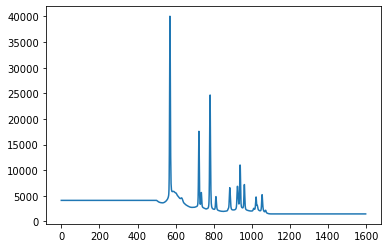

In [6]:
plt.plot(np.pad(patterns[0], 500, mode = 'edge'))

In [67]:
def plot_df(*args):
    df = pd.DataFrame([p for p, _ in args]).T
    df.columns = [l for _, l in args ]
    return df.plot()

def lowpass_g(size, y):
    gwindow = signal.gaussian(len(y), std = size)
    L = power(fftshift(fft(gwindow)))
    L /= L.max()
    return L

def clip_high(x, frac_zero):
    x2  = x.copy()
    mask = clip_high_filter(x, frac_zero)
    return x2 * mask

def clip_high_window(x, frac_zero):
    """ low pass filter
    """
    x = ifftshift(x)
    N = len(x)
    nz = int(frac_zero * N)
    x2  = np.ones_like(x)
    x2[(N - nz) // 2 : (N + nz) // 2] = 0
    #x2[(-nz) // 2:] = 0
    return fftshift(x2)

# def clip_low(x, frac_zero, invert = False, inc_window = False):
#     N = len(x)
#     nz = int(frac_zero * N)
#     x2  = x.copy()
#     mask = np.ones_like(x)
#     mask[:( nz) // 2 ] = 0
#     mask[(-nz) // 2:] = 0
#     if inc_window:
#         window = np.blackman(N)
#         mask *= window
#     if invert:
#         mask = 1 - mask
#     x2 = x2 * mask
        
# #     x2[:( nz) // 2 ] = 0
# #     x2[(-nz) // 2:] = 0
#     return x2, mask

def clip_low(x, frac_zero, invert = False, inc_window = False):
    x2  = x.copy()
    mask = clip_low_window(x, frac_zero, invert = invert, inc_window = inc_window)
    return x2, mask

def clip_low_window(x, frac_zero, invert = False, inc_window = False):
    x = ifftshift(x)
    N = len(x)
    nz = int(frac_zero * N)
    x2  = x.copy()
    mask = np.ones_like(x)
    mask[:( nz) // 2 ] = 0
    mask[(-nz) // 2:] = 0
    if inc_window:
        window = np.blackman(N)
        mask *= window
    if invert:
        mask = 1 - mask
    return fftshift(mask)
        
#     x2[:( nz) // 2 ] = 0
#     x2[(-nz) // 2:] = 0
    return x2, mask

# def clip_low_window(x, frac_zero):
#     def clip_low(x, frac_zero, invert = False, inc_window = False):
#     N = len(x)
#     nz = int(frac_zero * N)
#     x2  = x.copy()
#     mask = np.ones_like(x)
#     mask[:( nz) // 2 ] = 0
#     mask[(-nz) // 2:] = 0
#     if inc_window:
#         window = np.blackman(N)
#         mask *= window
#     if invert:
#         mask = 1 - mask


def highpass_g(size, y):
    return 1 - lowpass_g(size, y)

def if_mag(patterns, arr, phase = 0, truncate = False):
    trunc = len(arr) - len(patterns[0])
    phase = np.exp(1j * phase)
    tmp = ifft(ifftshift(arr))
    if truncate:
        return np.real(np.sqrt(np.conjugate(tmp * phase) * tmp))[trunc // 2: -trunc // 2]
    return np.real(np.sqrt(np.conjugate(tmp * phase) * tmp))

def spec_fft(patterns, i, pad = 1000, roll = 0, do_conv_window = False, do_window = True, log = False, dat = None):
    if dat is not None:
        pi = dat
    else:
        pi = patterns[i]
    if log:
        y = np.pad(np.log(pi + 1), pad, mode = 'edge')
    else:
        y = np.pad(pi, pad, mode = 'edge')
    y = np.roll(y, roll)
    # Number of sample points
    N = y.shape[0]
    w = blackman(N)
    #w = 1
    #yf = fft(y * w)
    if do_window:
        ywf = fftshift(fft(y*w))
    else:
        ywf = fftshift(fft(y))
    if do_conv_window:
        ywf = conv_window(ywf)
    return w, ywf

def power(arr):
    ampsq = arr * np.conjugate(arr)
    return np.real(ampsq)

def mag(x):
    return np.sqrt(power(x))

def lorenz(gamma, x, x0):
    return ( 1. / (np.pi * gamma)) * (gamma**2) / ((x - x0)**2 + gamma**2)

def do_rl(sig, window_width = 4, peak_width = 2, window_type = 'gaussian',
         bwindow = None, norm = False):
    if window_type == 'gaussian':
        gwindow = signal.gaussian(len(y), std = window_width)
        #gwindow = lorenz(peak_width, np.arange(len(sig)), len(sig) // 2)
        L = power(fftshift(fft(gwindow)))
        L /= L.max()
        H = 1 - L
    elif window_type == 'step':
        H = clip_low_window(sig, .001) * bwindow
    else:
        raise ValueError
    
    g = signal.gaussian(len(y), std = peak_width)
    gfft = fftshift(fft(g))
    
    psf = mag(ifft(gfft * H))[:, None].T
    psf_1d = psf[:, 1275:1324]
    deconvolved_RL = restoration.richardson_lucy((sig[:, None].T) / (10 * sig.max()), psf_1d, iterations=120)
    if not norm:
        return deconvolved_RL[0]
    else:
        return deconvolved_RL[0] / deconvolved_RL[0].mean()
    
# def gen_noise(smooth = 10):
#     noise = 100000 * np.random.uniform(size = len(patterns[0]))
#     noise = gf(noise, smooth)
#     return noise

def conv_window(sig, mode = 'same'):
    tmp = np.real(np.sqrt(fftshift(fft(window)) * np.conjugate(fftshift(fft(window)))))
    return np.convolve(sig, tmp / tmp.max(), mode =mode)#if_mag(clip_low(ywf, .01) * window)

def filter_bg(patterns, i, smooth = 1.5, window_type = 'gaussian', blackman = True,
             deconvolve = False, invert = False):
    cutoff = 4
    window, ywf = spec_fft(patterns, i, 1000)
    if window_type == 'gaussian': #todo inversion
        sig = if_mag(patterns, highpass_g(cutoff, ywf) * ywf)
    elif window_type == 'step': # hard step
        clipped, mask = clip_low(ywf, .001, invert = invert)
        if blackman:
            if invert:
                window = 1 - window
            mask *= window
            sig = if_mag(patterns, clipped * window)
        else:
            sig = if_mag(patterns, clipped)
    else:
        raise ValueError
    if deconvolve:
        sig = do_rl(sig, cutoff, 2.2)
    sig = gf(sig, smooth)
    return sig[1000: -1000]#, mask[1000: -1000]

from ipywidgets import interactive
import matplotlib.pyplot as plt
import numpy as np

def iplot_rows(patterns, patterns2 = None, label1 = 'raw', label2 = 'curve fit subtraction',
              log = False, offset = 0, height = '550px'):
    plt.rcParams["figure.figsize"]=(12, 9)
    def f(i):
        if log:
            plt.semilogy()
        plt.plot(patterns[i] + offset, label = label1)
        if patterns2 is not None:
            plt.plot(patterns2[i] + offset, label = label2)
        plt.legend()
        plt.grid()

    interactive_plot = interactive(f, i=(0, len(patterns)), step = 1)
    output = interactive_plot.children[-1]
    output.layout.height = height
    return interactive_plot

def logim(arr, offset = 1):
    plt.imshow(np.log(offset + arr), cmap = 'jet')

<IPython.core.display.Javascript object>


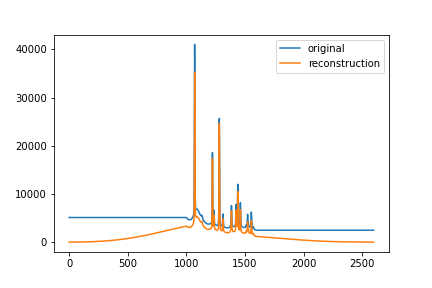

In [333]:
#y = patterns[0]

def get_fft(pad = 1000, window = True):
    y = np.pad(patterns[0], pad, mode = 'edge')

    # Number of sample points
    N = y.shape[0]
    # sample spacing
    T = 1.0 / 800.0
    x = np.linspace(0.0, N*T, N, endpoint=False)

    from scipy.signal import blackman

    w = blackman(N)
    #w = 1

#     yf = fft(y * w)
    if window:
        ywf = fftshift(fft(y*w))
    else:
        ywf = fftshift(fft(y))
    xf = fftfreq(N, T)[:N//2]
    return y, ywf

y, ywf = get_fft(pad = 1000, window = True)
N = len(y)
window = np.blackman(N)


plt.plot(1000 + y, label = 'original')
#plt.plot(yy, label = 'fft')
tmp = ifft(ifftshift(ywf))
rec = np.real(np.sqrt(tmp * np.conjugate(tmp)))
plt.plot(rec, label = 'reconstruction')
plt.legend()

<IPython.core.display.Javascript object>


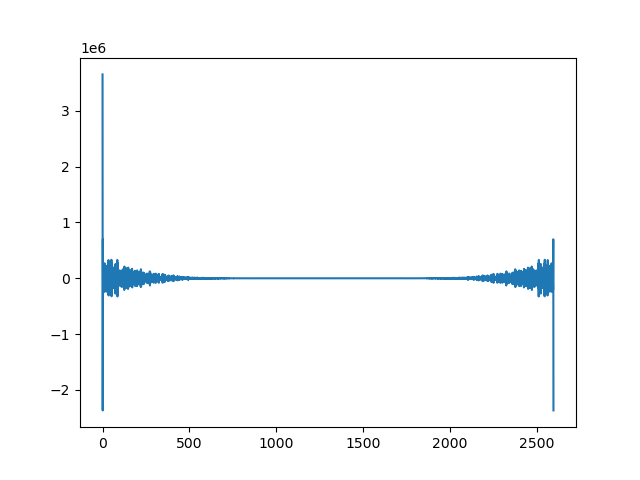

/Users/ollie/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1289: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [98]:
plt.plot(clip_high(ywf, .0))
#plt.plot(ywf)

In [214]:
plt.rcParams["figure.figsize"]=(20, 10)

In [217]:
%matplotlib notebook

<IPython.core.display.Javascript object>


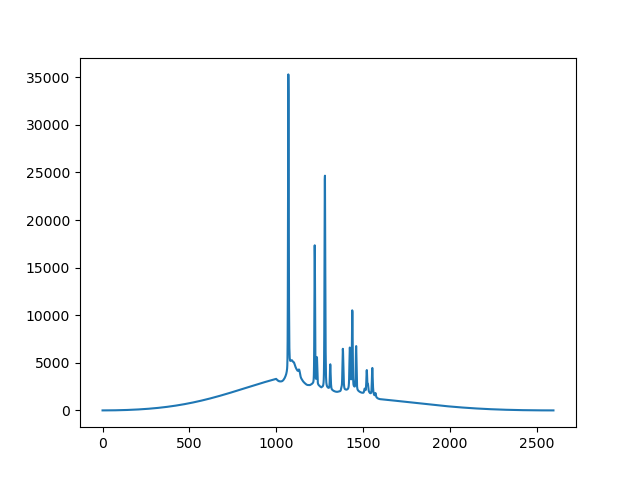

In [99]:
plt.plot(y * window)

In [84]:
bgsubbed_nosmooth = np.vstack([filter_bg(patterns, i, 0, deconvolve = True) for i in range(len(patterns))])
bgsubbed = np.vstack([filter_bg(patterns, i, 1.7, deconvolve=True) for i in range(len(patterns))])

KeyboardInterrupt: 

In [102]:
%matplotlib inline

### Gaussian window + deconvolution:

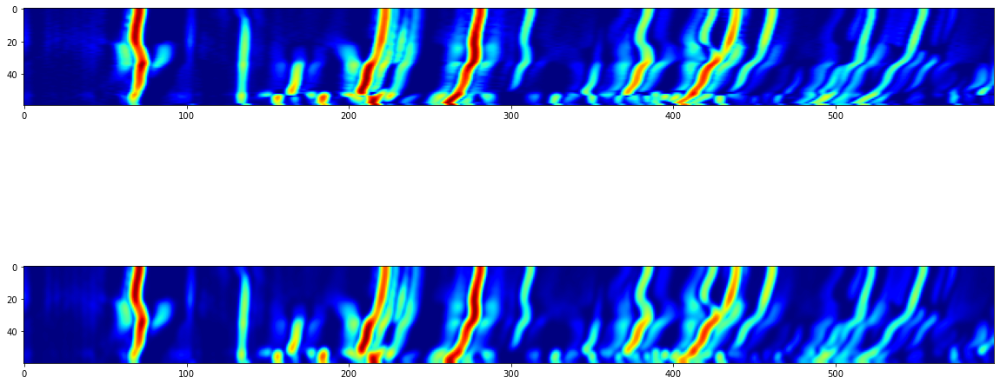

In [196]:
plt.rcParams["figure.figsize"]=(20, 10)
a, b = 2, 1
plt.subplot(a, b, 1)
floor = 5
plt.imshow(np.log(bgsubbed.mean() / floor + bgsubbed), cmap = 'jet')
plt.subplot(a, b, 2)
plt.imshow(np.log(bgsubbed.mean() / floor + gf(bgsubbed_nosmooth, 1.5)), cmap = 'jet')

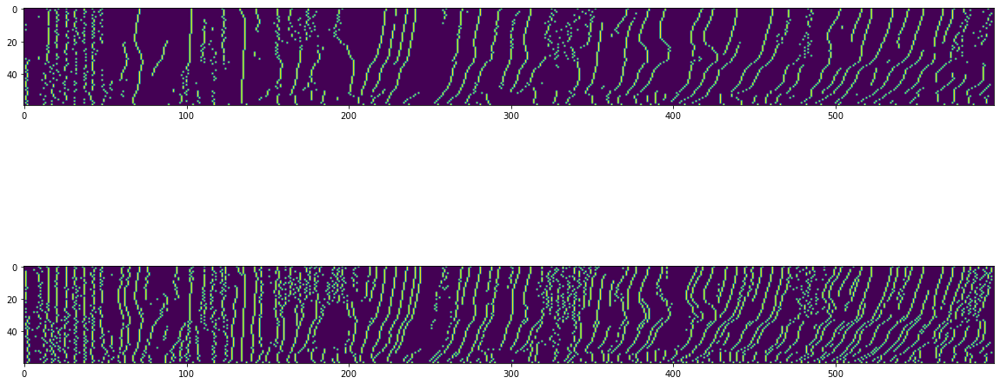

In [197]:
a, b = 2, 1
plt.subplot(a, b, 1)
plt.imshow(feat.get_ridges(bgsubbed, axis = 1))

plt.subplot(a, b, 2)
plt.imshow(feat.get_ridges(bgsubbed_nosmooth, axis = 1))

### Blackman window + no deconvolution

In [993]:
bgsubbed_nosmooth = np.vstack([filter_bg(patterns, i, 0, window_type = 'step', deconvolve = False) for i in range(len(patterns))])
bgsubbed = np.vstack([filter_bg(patterns, i, 1.7, window_type = 'step', deconvolve=False) for i in range(len(patterns))])

In [70]:
bgsubbed_nosmooth_nowindow = np.vstack([filter_bg(patterns, i, 0, window_type = 'step', deconvolve = False, blackman = False) for i in range(len(patterns))])


<IPython.core.display.Javascript object>


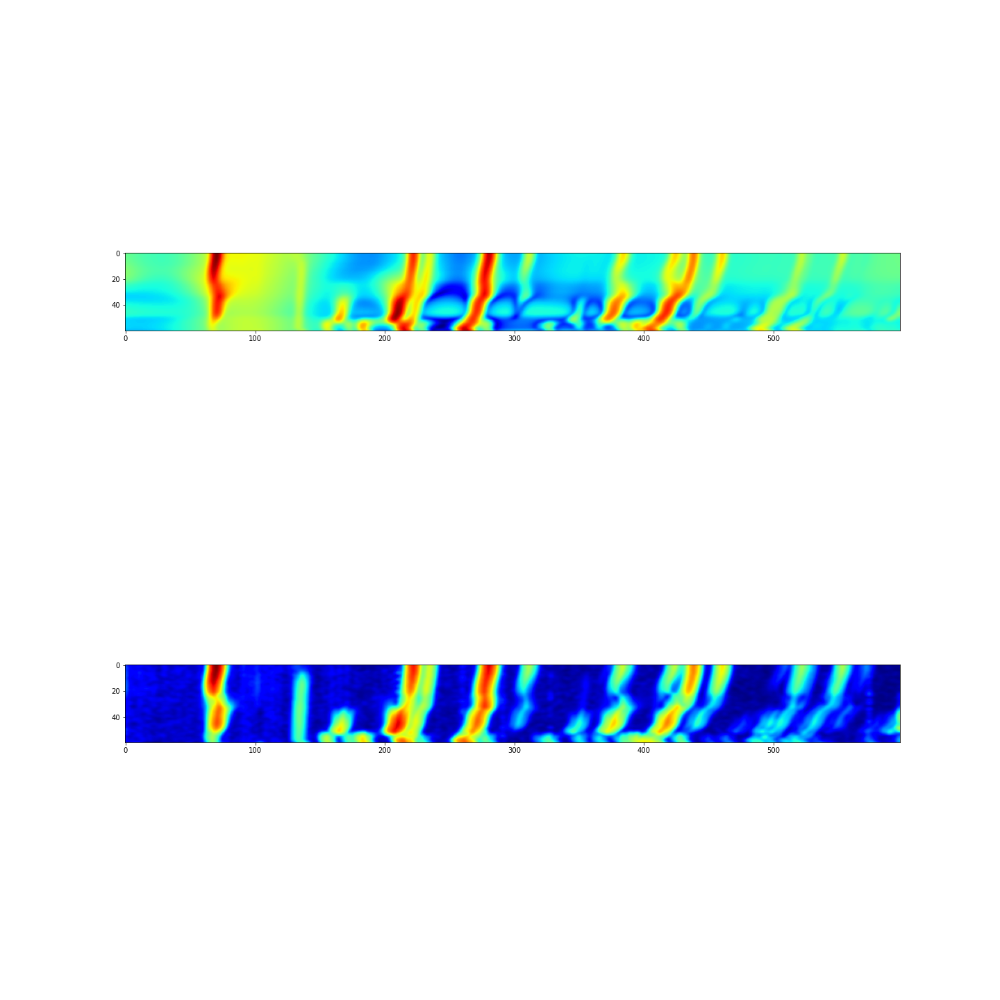

In [78]:
plt.subplot(2, 1, 1)
plt.imshow(np.log(1 + gf(bgsubbed_nosmooth_nowindow, (1, 1.7))), cmap = 'jet')
plt.subplot(2, 1, 2)
plt.imshow(np.log(1 + gf(bgsubbed_nosmooth, (1, 1.7))), cmap = 'jet')

In [994]:
bgsubbed_final = gf(bgsubbed_nosmooth, (1, 1.7))

In [995]:
bgsubbed_final *= patterns.max() / bgsubbed_final.max() #np.percentile(patterns, 99.9) / np.percentile(bgsubbed_final, 99.9)

In [89]:
bgsubbed_nosmooth_inverted = np.vstack([filter_bg(patterns, i, 0, window_type = 'step', deconvolve = False, invert= True) for i in range(len(patterns))])


<IPython.core.display.Javascript object>


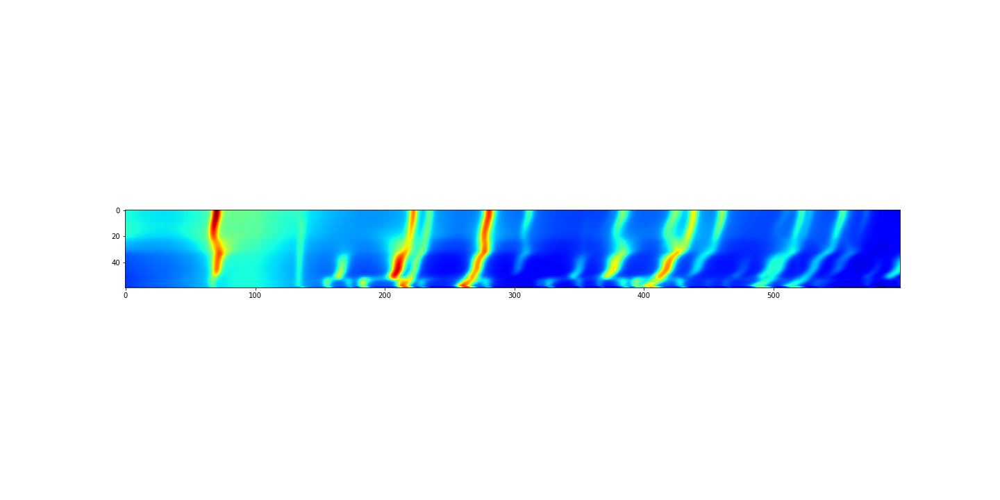

In [94]:
plt.imshow(np.log(1 + patterns), cmap = 'jet')

In [348]:
bgsubbed_final.mean(), patterns.mean()

(1039.0764428882783, 3432.801464761985)

In [102]:
full_smooth = gf(bgsubbed_nosmooth, (1, 1.7))
q_smooth = gf(bgsubbed_nosmooth, (1, 0))
t_smoothing_residuals = (full_smooth - q_smooth)

## temperature dimension low-pass filtering

<IPython.core.display.Javascript object>


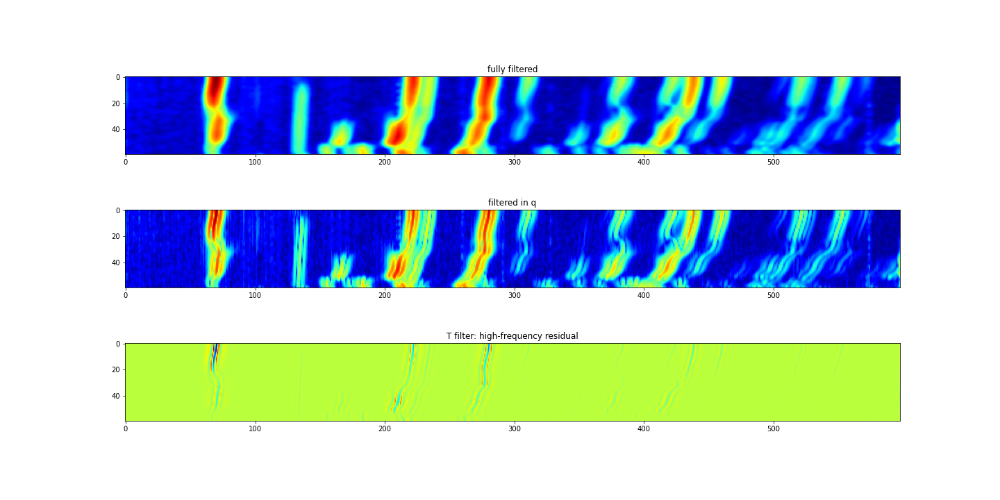

In [105]:
a, b = 3, 1
plt.subplot(a, b, 1)
plt.imshow(np.log(1 + full_smooth), cmap = 'jet')
plt.title('fully filtered')
plt.subplot(a, b, 2)
plt.imshow(np.log(1 + q_smooth), cmap = 'jet')
plt.title('filtered in q')
plt.subplot(a, b, 3)
plt.title('T filter: high-frequency residual')
plt.imshow(t_smoothing_residuals, cmap = 'jet')

In [991]:
bgsubbed_final

array([[4936.26228149, 4926.92077074, 4910.91000141, ..., 1810.86251656,
        1805.3933046 , 1802.35372942],
       [4924.93126728, 4915.35673965, 4899.12971519, ..., 1809.34546708,
        1803.99723811, 1801.0353743 ],
       [4905.1533084 , 4895.36864597, 4879.04353167, ..., 1806.13271406,
        1800.94209357, 1798.0847721 ],
       ...,
       [2374.71205633, 2383.58780748, 2399.62238238, ..., 1908.0685003 ,
        1957.53738353, 1988.26501807],
       [2342.95700987, 2352.02719471, 2368.44103765, ..., 1758.41147008,
        1798.82834243, 1824.47727756],
       [2289.03635861, 2298.3818683 , 2315.28080889, ..., 1560.23845065,
        1583.34432021, 1598.79839852]])

In [998]:
from xrdc import fourier

In [999]:
bgsubbed_nosmooth = np.vstack([fourier.filter_bg(patterns, i, 0, window_type = 'step', deconvolve = False) for i in range(len(patterns))])
#bgsubbed = np.vstack([filter_bg(patterns, i, 1.7, window_type = 'step', deconvolve=False) for i in range(len(patterns))])

In [1004]:
bgsubbed_final = gf(bgsubbed_nosmooth, (1, 1.7))
bgsubbed_final *= patterns.mean() / bgsubbed_final.mean() #np.percentile(patterns, 99.9) / np.percentile(bgsubbed_final, 99.9)

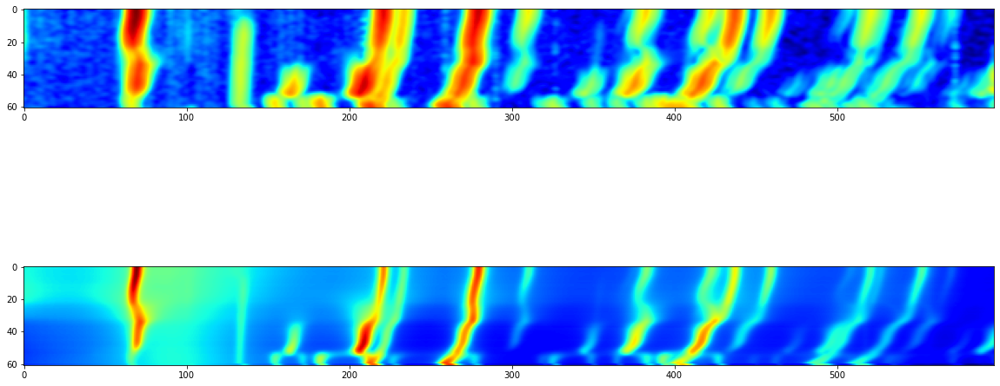

In [1005]:
plt.rcParams["figure.figsize"]=(20, 10)
a, b = 2, 1
plt.subplot(a, b, 1)
plt.imshow(np.log(1 + bgsubbed_final), cmap = 'jet')
plt.subplot(a, b, 2)
plt.imshow(np.log(1 + patterns), cmap = 'jet')

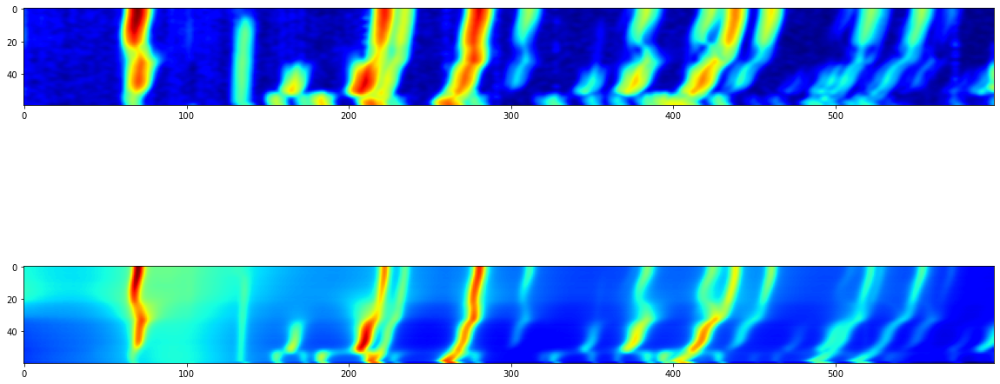

In [134]:
plt.rcParams["figure.figsize"]=(20, 10)
a, b = 2, 1
plt.subplot(a, b, 1)
plt.imshow(np.log(1 + bgsubbed_final), cmap = 'jet')
plt.subplot(a, b, 2)
plt.imshow(np.log(1 + patterns), cmap = 'jet')

^ put these on the same scale

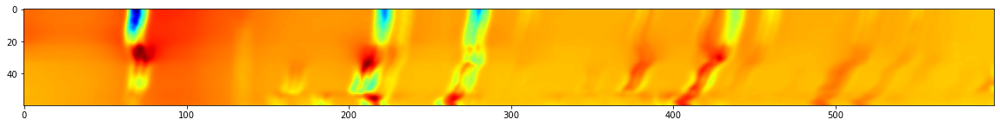

In [327]:
plt.imshow(gf(patterns, (1, 1.7)) - bgsubbed_final + bgsubbed_final.max(), cmap = 'jet')

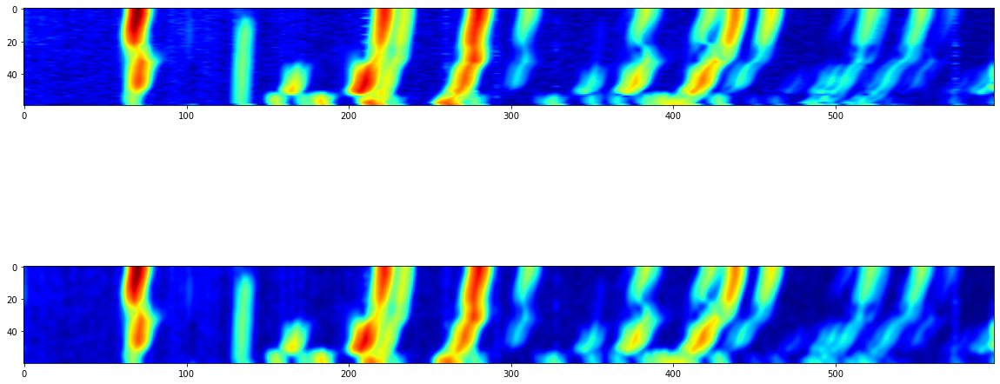

In [105]:
plt.rcParams["figure.figsize"]=(20, 10)
a, b = 2, 1
plt.subplot(a, b, 1)
plt.imshow(np.log(1 + bgsubbed), cmap = 'jet')
plt.subplot(a, b, 2)
plt.imshow(np.log(1 + gf(bgsubbed_nosmooth, 1.5)), cmap = 'jet')

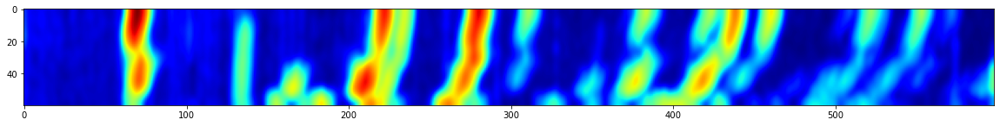

In [349]:
plt.imshow(np.log(1 + gf(bgsubbed_nosmooth, (3, 1.7))), cmap = 'jet')

In [261]:
bgsubbed_nosmooth_nb = np.vstack([filter_bg(patterns, i, 0, window_type = 'step', deconvolve = False, blackman = False) for i in range(len(patterns))])
bgsubbed_nb = np.vstack([filter_bg(patterns, i, 1.7, window_type = 'step', deconvolve=False, blackman = False) for i in range(len(patterns))])

In [263]:
%matplotlib inline

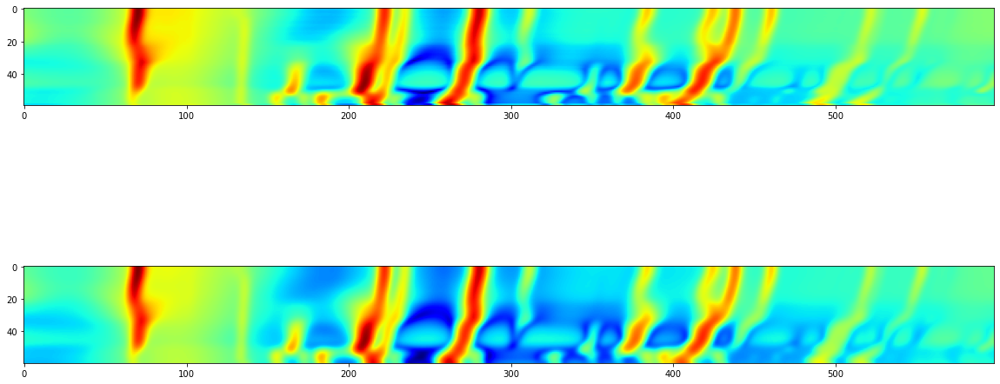

In [264]:
plt.rcParams["figure.figsize"]=(20, 10)
a, b = 2, 1
plt.subplot(a, b, 1)
plt.imshow(np.log(1 + bgsubbed_nb), cmap = 'jet')
plt.subplot(a, b, 2)
plt.imshow(np.log(1 + gf(bgsubbed_nosmooth_nb, 1.5)), cmap = 'jet')

## Filter T

In [150]:
highT_nosmooth = np.vstack([filter_bg(patterns.T, i, 0, window_type = 'step', deconvolve = False) for i in range(len(patterns.T))])


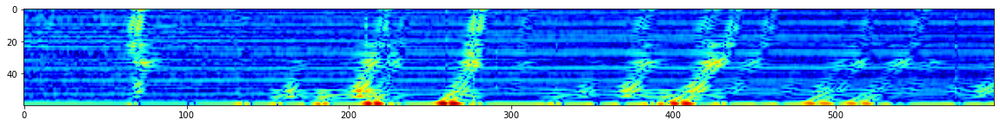

In [156]:
logim(gf(highT_nosmooth.T, 0))
#gf(highT_nosmooth.T, (1, 1.7))

In [304]:
%matplotlib inline
iplot_rows(highT_nosmooth, patterns.T, 'high-freq', 'raw', log = True, offset = 1)

interactive(children=(IntSlider(value=30, description='i', max=60), Output(layout=Layout(height='350px'))), _d…

Mean relative magnitude of high-frequency T:

In [169]:
highT_nosmooth.mean() / patterns.mean()

0.004265594279982498

## Robust PCA

In [111]:
import r_pca
rpca = r_pca.R_pca(bgsubbed)

In [112]:
L, S = rpca.fit(max_iter=10000, iter_print=100)

iteration: 1, error: 5.713696773970641
iteration: 100, error: 0.0998419863483455
iteration: 200, error: 0.05817492248870591
iteration: 300, error: 0.03639542581301932
iteration: 400, error: 0.039082478580740466
iteration: 500, error: 0.024204277321462065
iteration: 600, error: 0.020828247223833127
iteration: 700, error: 0.019774599724597636
iteration: 800, error: 0.014862548543414242
iteration: 900, error: 0.012298539567345038
iteration: 1000, error: 0.016370868159118503
iteration: 1100, error: 0.011209437125325733
iteration: 1200, error: 0.009671451412512815
iteration: 1300, error: 0.01185572359442887
iteration: 1400, error: 0.00823218149794696
iteration: 1500, error: 0.007656919947405659
iteration: 1600, error: 0.007073937808924482
iteration: 1700, error: 0.005863528378420568
iteration: 1800, error: 0.005601325889596915
iteration: 1900, error: 0.005032895541520742
iteration: 2000, error: 0.004736877497402607
iteration: 2100, error: 0.0035445373658004246
iteration: 2200, error: 0.0052

ymin: 0.07639766766768637, ymax: 510.480855005883


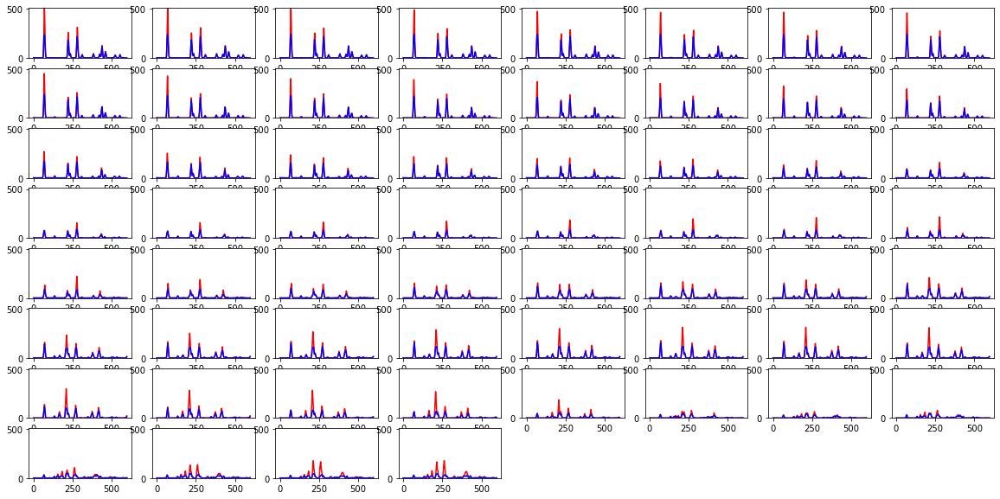

In [206]:
rpca.plot_fit()
#plt.show()

In [220]:
np.linalg.matrix_rank(L)

33

### Unfiltered Data

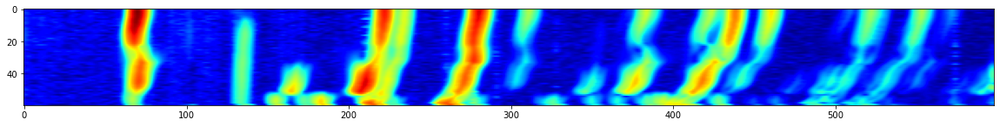

In [212]:
plt.imshow(np.log(1 + bgsubbed), cmap = 'jet')

### Low-rank component

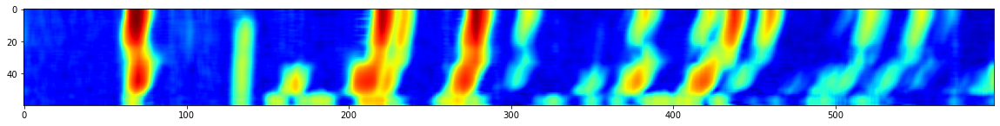

In [211]:
plt.imshow(np.log(1 + L), cmap = 'jet')

### Sparse component:

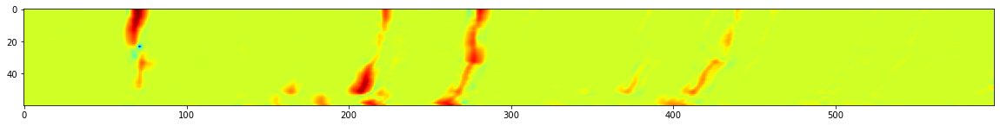

In [219]:
plt.imshow(np.log(1 - S.min() + S), cmap = 'jet')

In [726]:
plt.rcParams["figure.figsize"]=(8, 8)

<IPython.core.display.Javascript object>


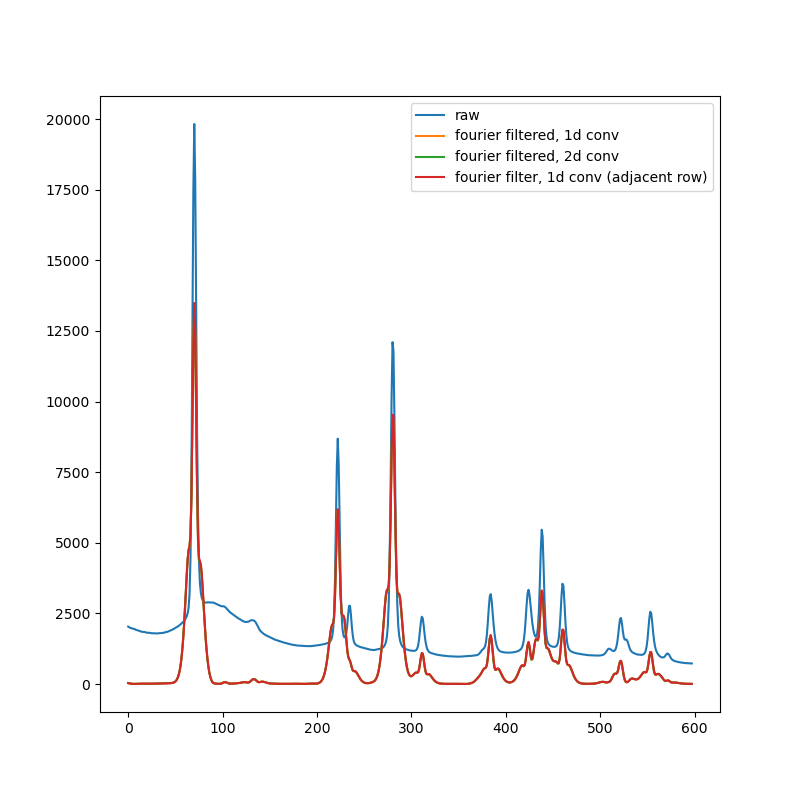

<AxesSubplot:>

In [1074]:
i = 2
df = pd.DataFrame([patterns[i] / 2, bgsubbed[i], gf(bgsubbed_nosmooth, 1.7)[i], bgsubbed[i - 1]]).T
df.columns = ['raw', 'fourier filtered, 1d conv', 'fourier filtered, 2d conv', 'fourier filter, 1d conv (adjacent row)']
df.plot()

In [715]:
%matplotlib inline

<IPython.core.display.Javascript object>


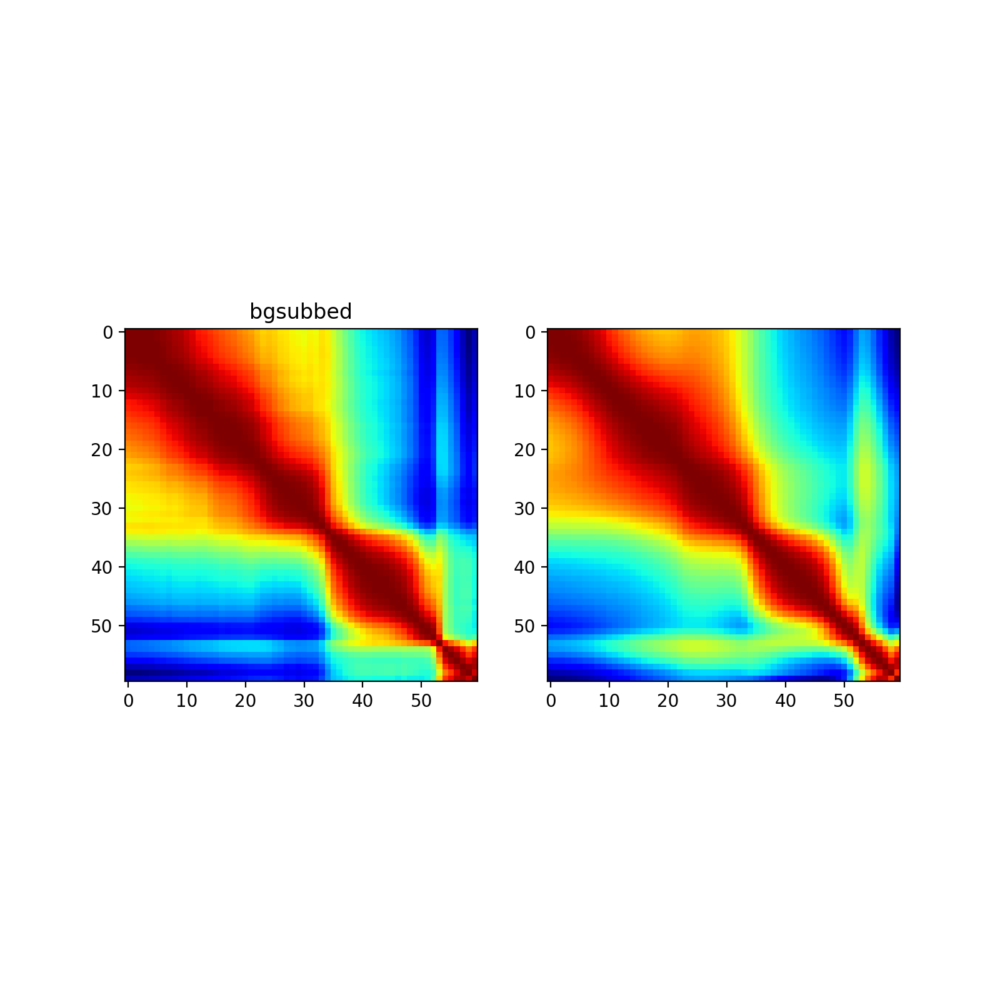

In [825]:
plt.subplot(1, 2, 1)
plt.imshow(feat.csim_pairs(bgsubbed), cmap = 'jet')
plt.title('bgsubbed')
plt.subplot(1, 2, 2)
plt.imshow(feat.csim_pairs(patterns), cmap = 'jet')

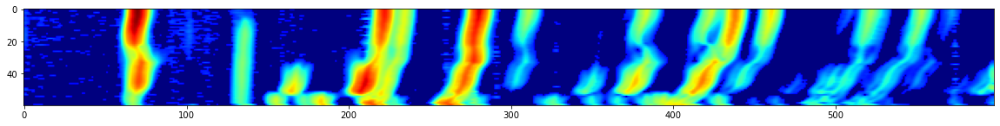

In [656]:
# with below-median set to 0
plt.rcParams["figure.figsize"]=(20, 10)

plt.imshow(np.log(1 + bgsubbed), cmap = 'jet')

In [229]:
from importlib import reload
reload(feat)

<module 'xrdc.featurization' from '/Users/ollie/anaconda3/lib/python3.7/site-packages/xrdc-1.0-py3.7.egg/xrdc/featurization.py'>

Peak at 70, start iteration with error = 0.523169979332379
Peak at 70, iteration 0: error = 5.116190855901569
Peak at 68, start iteration with error = 0.5401483620944139
Peak at 68, iteration 0: error = 3.9796357860237888
Peak at 277, start iteration with error = 0.5141474248224633
Peak at 277, iteration 0: error = 2.992912364440993
Peak at 277, start iteration with error = 0.5051904662363104
Peak at 277, iteration 0: error = 1.7511609944811461
Peak at 211, start iteration with error = 0.5481882213902446
Peak at 211, iteration 0: error = 3.0788028508475067
Peak at 208, start iteration with error = 0.5462459075301165
Peak at 208, iteration 0: error = 2.7498801054295114
27
0.5319840735821715


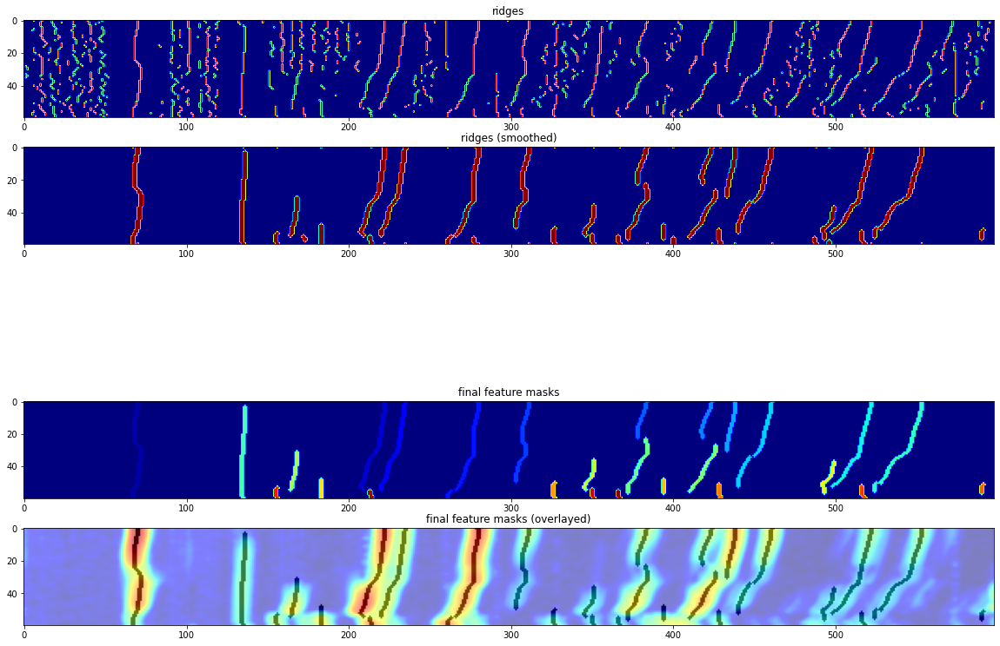

In [52]:
patterns_pp = bgsubbed_final
labeled, feature_masks, activations_bgsubbed, activations_n0, activations_n1_bgsubbed = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 1, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    thicken_ax0 = 1, thicken_ax1 = 1, flood_threshold=.95, smooth_factor_ax1 = .125)

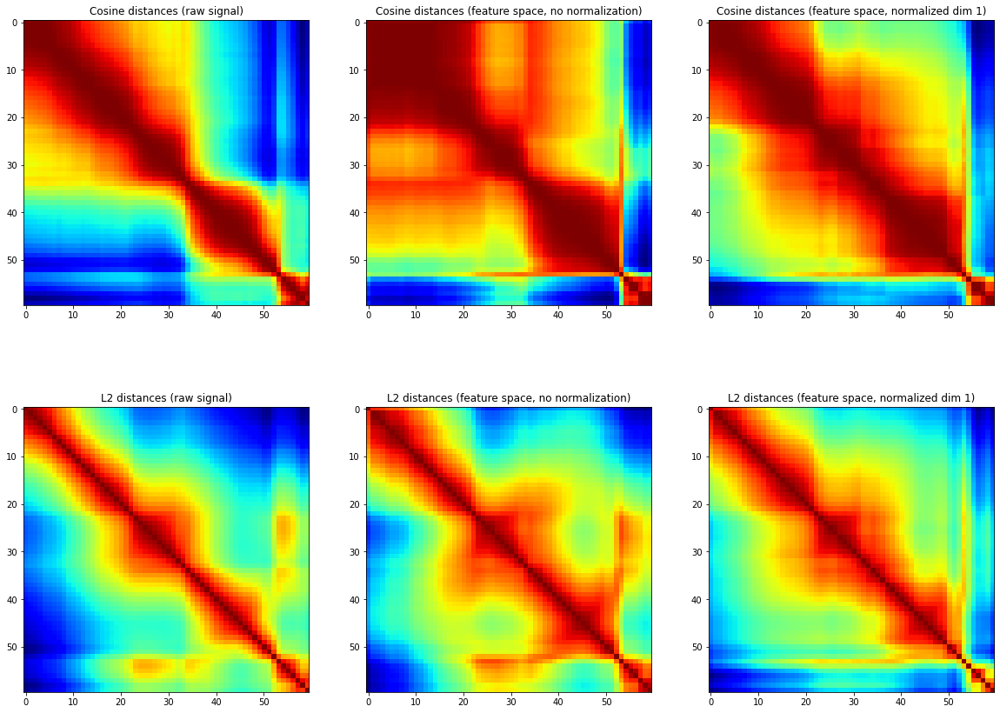

In [333]:
a, b = 2, 3
plt.rcParams["figure.figsize"]=(20, 15)

feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed,
                        a = a, b = b)
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed, offset = 3,
                        a = a, b = b)


## Final choice:

Peak at 70, start iteration with error = 0.5231699793322527
Peak at 70, iteration 0: error = 5.11619084188093
Peak at 68, start iteration with error = 0.5401483620944559
Peak at 68, iteration 0: error = 3.979635854303144
Peak at 277, start iteration with error = 0.5141474248224647
Peak at 277, iteration 0: error = 2.9929123509133664
Peak at 277, start iteration with error = 0.5051904662362396
Peak at 277, iteration 0: error = 1.7511609988816887
Peak at 211, start iteration with error = 0.5481882213902292
Peak at 211, iteration 0: error = 3.078802851226662
Peak at 208, start iteration with error = 0.5462459075300999
Peak at 208, iteration 0: error = 2.7498801116867155
30
0.4207874760358289


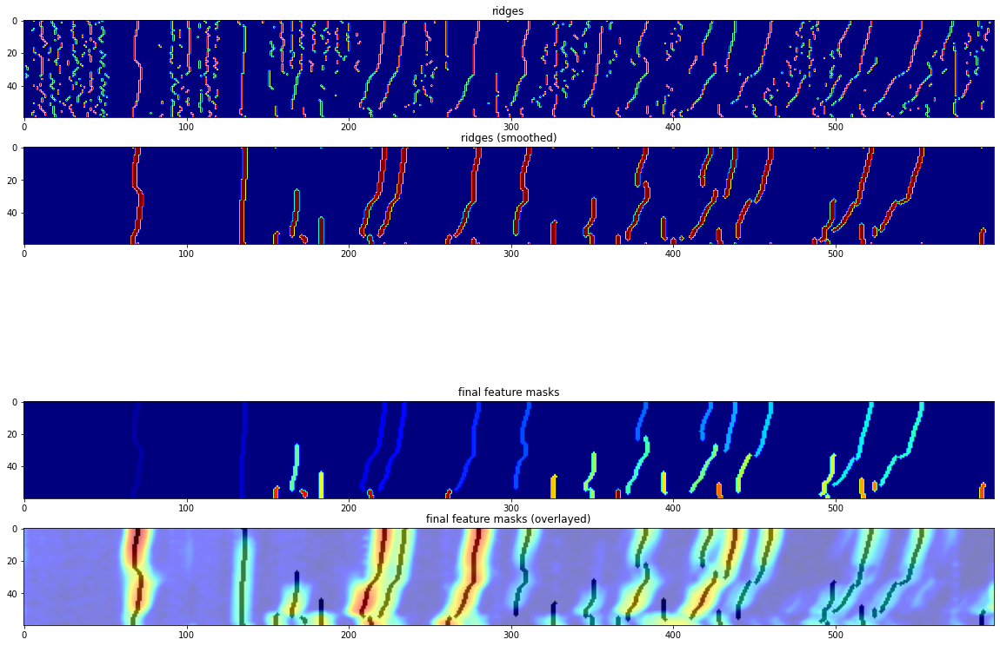

In [119]:
patterns_pp = gf(bgsubbed_nosmooth, (1, 1.7))
labeled, feature_masks, activations_bgsubbed, activations_n0, activations_n1_bgsubbed = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 2, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    thicken_ax0 = 1, thicken_ax1 = 1, flood_threshold=.95, smooth_factor_ax1 = .125)

mark 2

## Final choice, curve fit-based background subtraction

Peak at 70, start iteration with error = 0.7650442980233206
Peak at 70, iteration 0: error = 2.147876150955986
Peak at 69, start iteration with error = 0.7609503342704786
Peak at 69, iteration 0: error = 1.8074018064990232
Peak at 68, start iteration with error = 0.7747439489254021
Peak at 68, iteration 0: error = 1.7113332108454686
Peak at 277, start iteration with error = 0.7692997052600474
Peak at 277, iteration 0: error = 2.108104092906231
Peak at 211, start iteration with error = 0.8247967141201722
Peak at 211, iteration 0: error = 1.719280162743269
Peak at 208, start iteration with error = 0.7596171544183214
Peak at 208, iteration 0: error = 2.0435338702437296
29
0.251451716973812


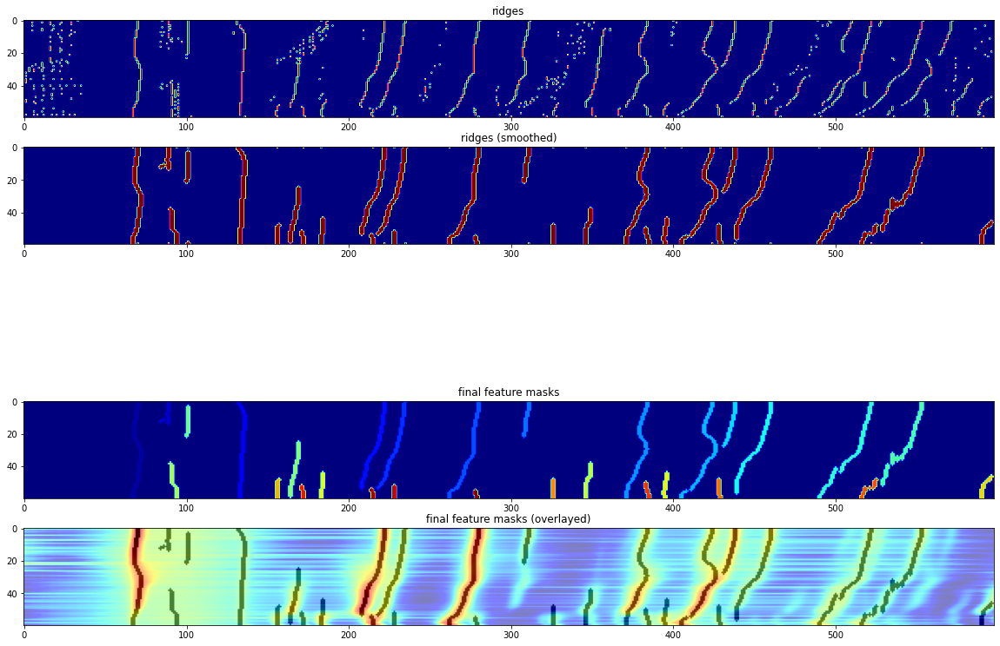

In [47]:
patterns_pp = bgsub_cheb
labeled, feature_masks, activations_bgsubbed_cheb, activations_n0, activations_n1_bgsubbed_cheb = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 2, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    thicken_ax0 = 1, thicken_ax1 = 1, flood_threshold=.95, smooth_factor_ax1 = .125)

Peak at 70, start iteration with error = 0.5224046040600858
Peak at 70, iteration 0: error = 5.142099401498798
Peak at 69, start iteration with error = 0.5219014626529119
Peak at 69, iteration 0: error = 3.985443746981135
Peak at 277, start iteration with error = 0.49898858381701866
Peak at 277, iteration 0: error = 2.953529311414848
Peak at 277, start iteration with error = 0.500242043284881
Peak at 277, iteration 0: error = 1.7929391648265913
Peak at 211, start iteration with error = 0.5274163260234146
Peak at 211, iteration 0: error = 3.1045281299463507
Peak at 208, start iteration with error = 0.5529816712341459
Peak at 208, iteration 0: error = 2.61666348946435
31
0.5529902869061788


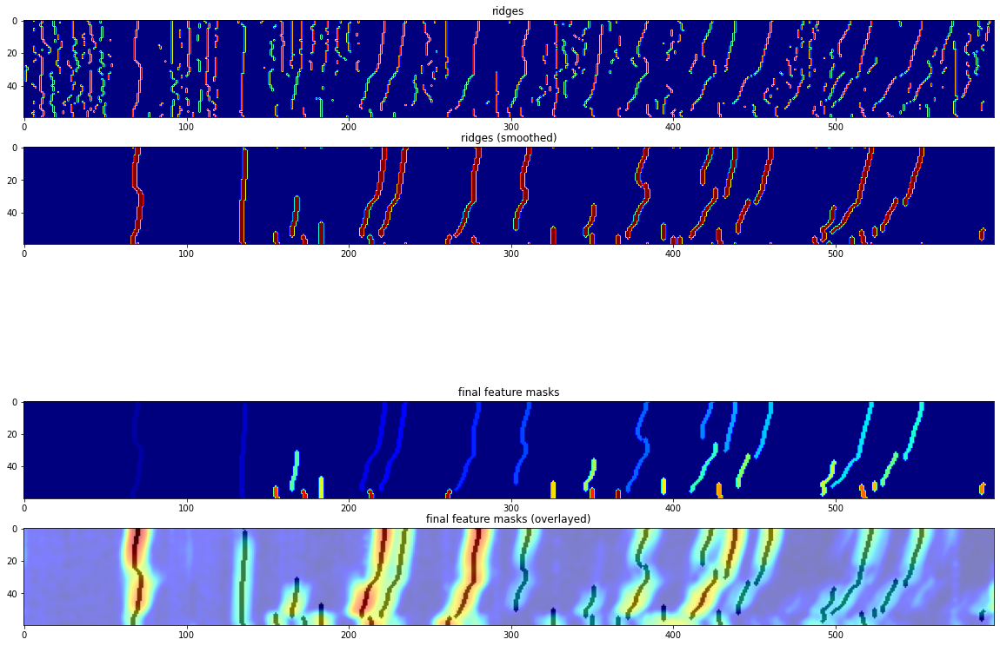

In [190]:
patterns_pp = gf(bgsubbed_nosmooth, 1.5)
# labeled, feature_masks, activations_bgsubbed, activations_n0, activations_n1_bgsubbed = feat.get_ridge_features(
#     patterns_pp,
#    smooth_ax1 = 'FWHM', smooth_ax0 = 2, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
#     log_scale_features = True, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
#     flood_threshold=.95)

# patterns_pp = gf(bgsubbed_nosmooth, 1.5)
labeled, feature_masks, activations_bgsubbed, activations_n0_thick, activations_n1_bgsubbed_thick = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 1, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    thicken_ax0 = 1, thicken_ax1 = 1, flood_threshold=.95, smooth_factor_ax1 = .125)


Peak at 70, start iteration with error = 0.5224046040600858
Peak at 70, iteration 0: error = 5.142099401498798
Peak at 69, start iteration with error = 0.5219014626529119
Peak at 69, iteration 0: error = 3.985443746981135
Peak at 277, start iteration with error = 0.49898858381701866
Peak at 277, iteration 0: error = 2.953529311414848
Peak at 277, start iteration with error = 0.500242043284881
Peak at 277, iteration 0: error = 1.7929391648265913
Peak at 211, start iteration with error = 0.5274163260234146
Peak at 211, iteration 0: error = 3.1045281299463507
Peak at 208, start iteration with error = 0.5529816712341459
Peak at 208, iteration 0: error = 2.61666348946435
31
0.5529902869061788


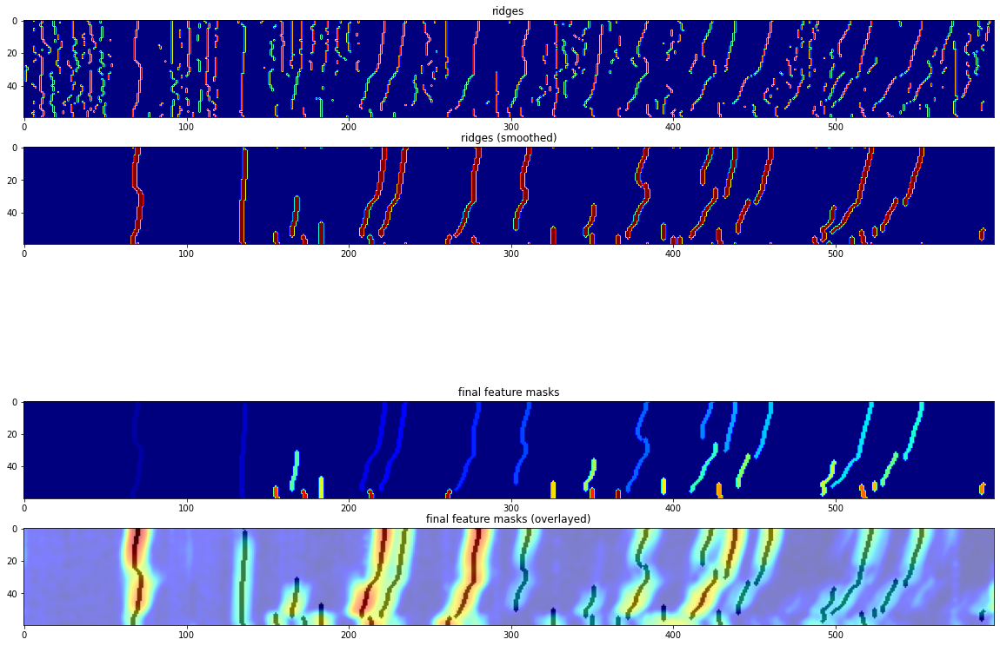

In [191]:
labeled, feature_masks, activations_bgsubbed, activations_n0, activations_n1_bgsubbed = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 1, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    thicken_ax0 = 1, thicken_ax1 = 1, flood_threshold=.95, smooth_factor_ax1 = .125)


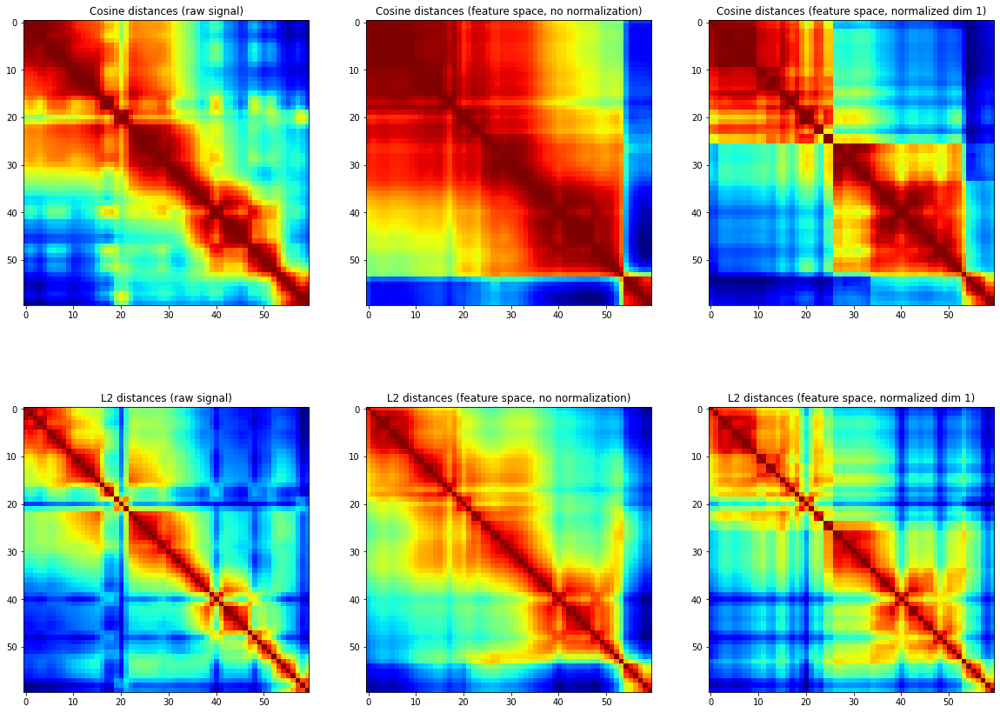

In [183]:
a, b = 2, 3
plt.rcParams["figure.figsize"]=(20, 15)

feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed,
                        a = a, b = b)
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed, offset = 3,
                        a = a, b = b)


{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

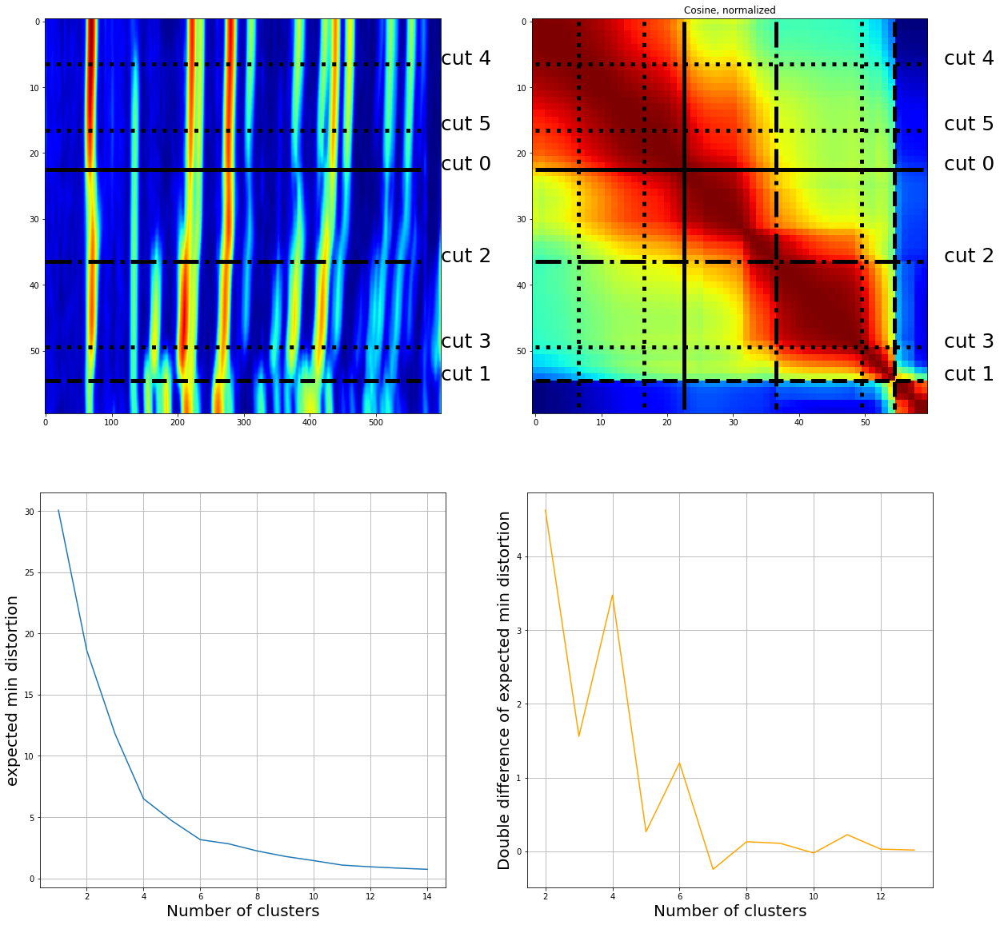

In [355]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed, activations_n1_bgsubbed, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

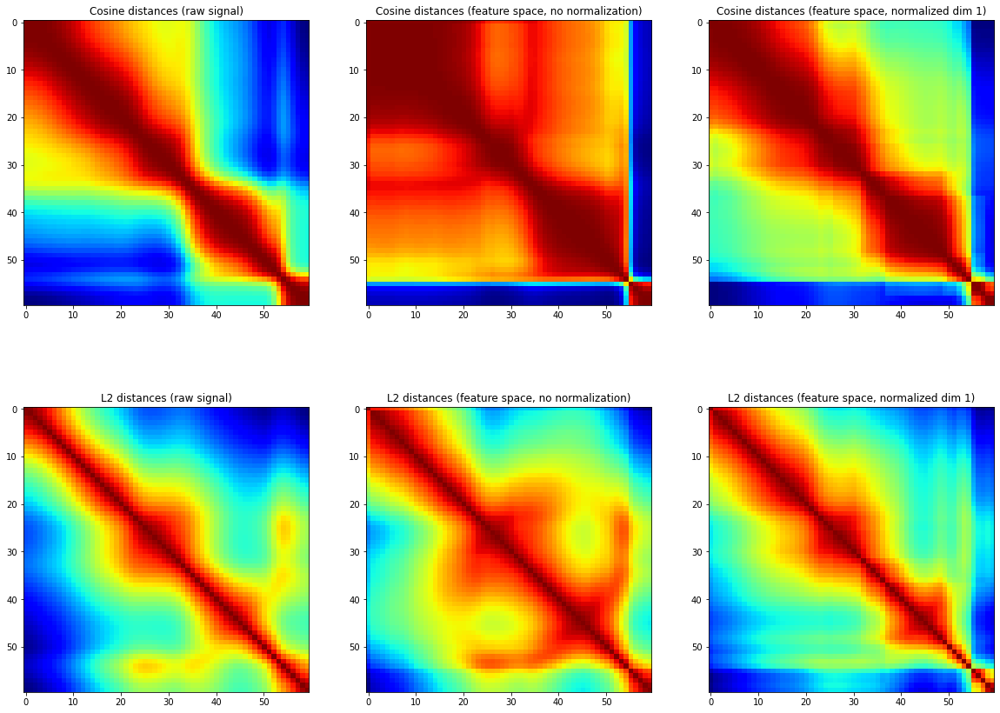

In [338]:
a, b = 2, 3
plt.rcParams["figure.figsize"]=(20, 15)

feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed,
                        a = a, b = b)
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed, offset = 3,
                        a = a, b = b)


Peak at 69, start iteration with error = 0.5386065092308313
Peak at 69, iteration 0: error = 4.224306983246128
Peak at 69, start iteration with error = 0.584404687470735
Peak at 69, iteration 0: error = 3.869727465255062
Peak at 278, start iteration with error = 0.5250067940175773
Peak at 278, iteration 0: error = 2.6893659069853015
Peak at 278, start iteration with error = 0.4872671593273784
Peak at 278, iteration 0: error = 1.6651521270626208
Peak at 70, start iteration with error = 0.561589605289645
Peak at 70, iteration 0: error = 3.7182049475293
Peak at 211, start iteration with error = 0.5452719689154105
Peak at 211, iteration 0: error = 2.139172981957407
25
0.3311032208364609


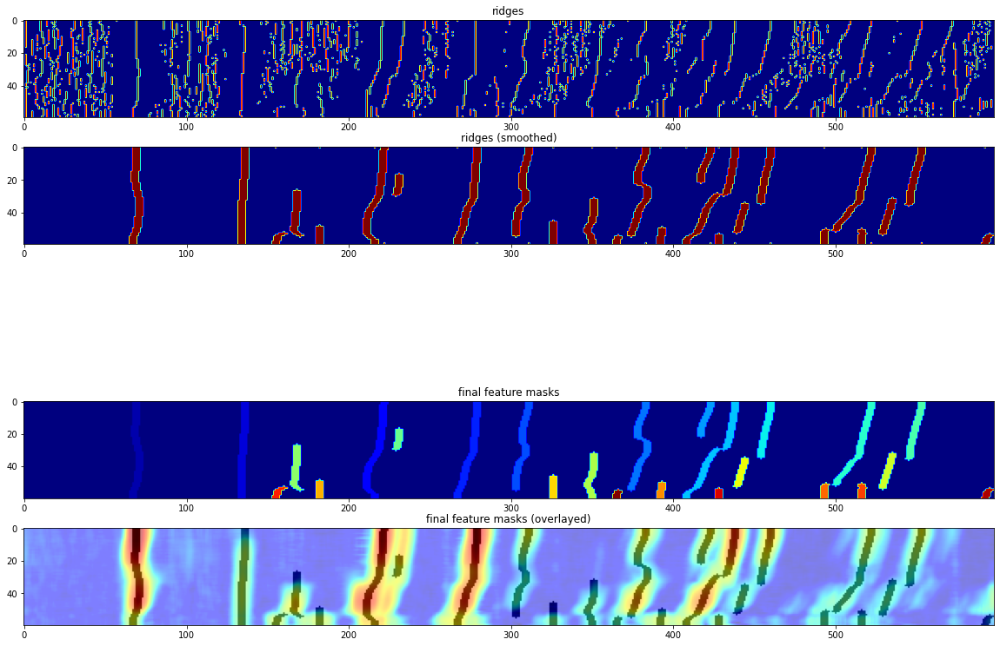

In [113]:
patterns_pp = L
labeled, feature_masks, activations_bgsubbed, activations_n0, activations_n1_bgsubbed = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 2, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    flood_threshold=.95)

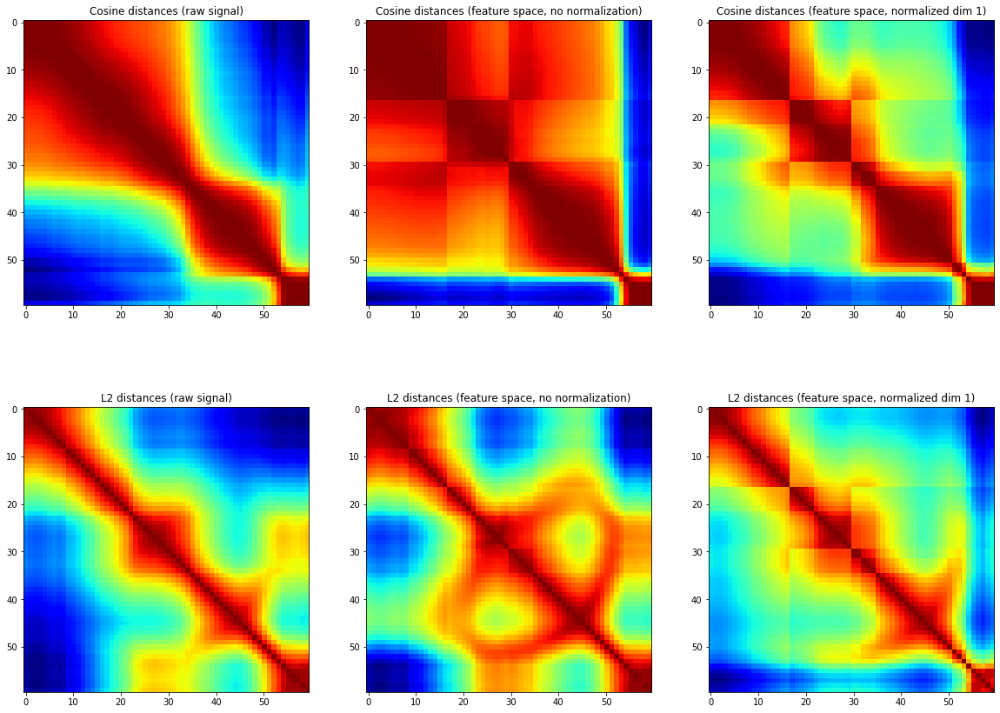

In [311]:
a, b = 2, 3
plt.rcParams["figure.figsize"]=(20, 15)

feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed,
                        a = a, b = b)
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed, offset = 3,
                        a = a, b = b)


## Similarity squares with 2d-filtered dataset:

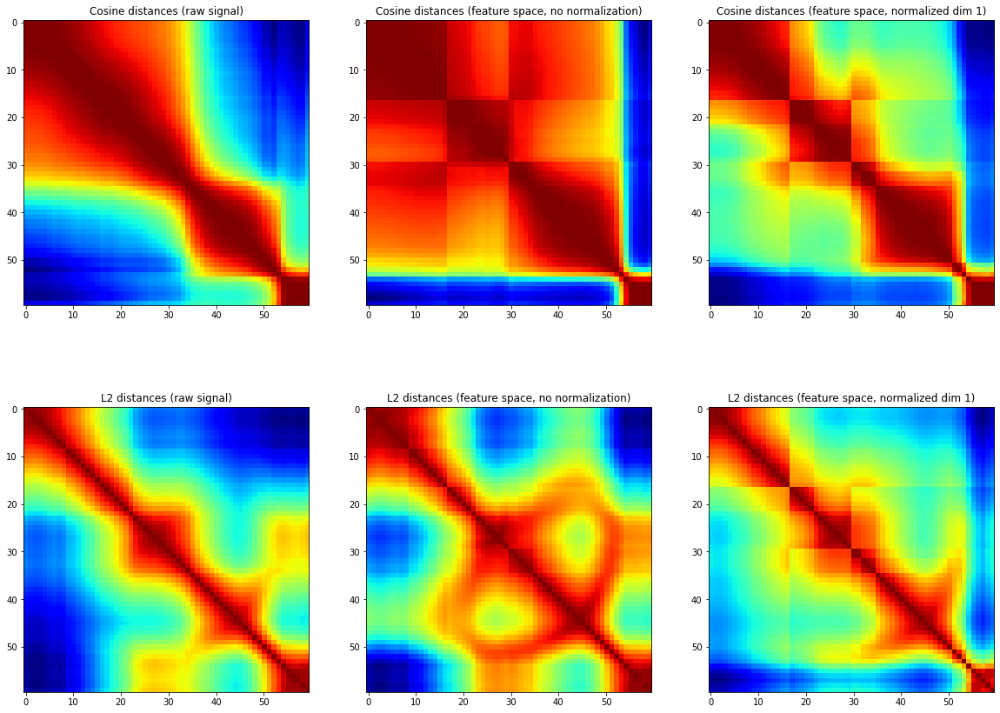

In [302]:
a, b = 2, 3
plt.rcParams["figure.figsize"]=(20, 15)

feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed,
                        a = a, b = b)
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed, offset = 3,
                        a = a, b = b)


Peak at 70, start iteration with error = 0.5011007989610137
Peak at 70, iteration 0: error = 0.31311612375253384
Peak at 69, start iteration with error = 0.49737648440362225
Peak at 69, iteration 0: error = 0.33575239692163455
Peak at 68, start iteration with error = 0.4815367603112972
Peak at 68, iteration 0: error = 0.3635990967499043
Peak at 277, start iteration with error = 0.46173510690483816
Peak at 277, iteration 0: error = 0.318285823808366
Peak at 211, start iteration with error = 0.41201363143907205
Peak at 211, iteration 0: error = 0.3089482936373865
Peak at 208, start iteration with error = 0.3848007576290296
Peak at 208, iteration 0: error = 0.3673086898869517
31
1547.7689000000028


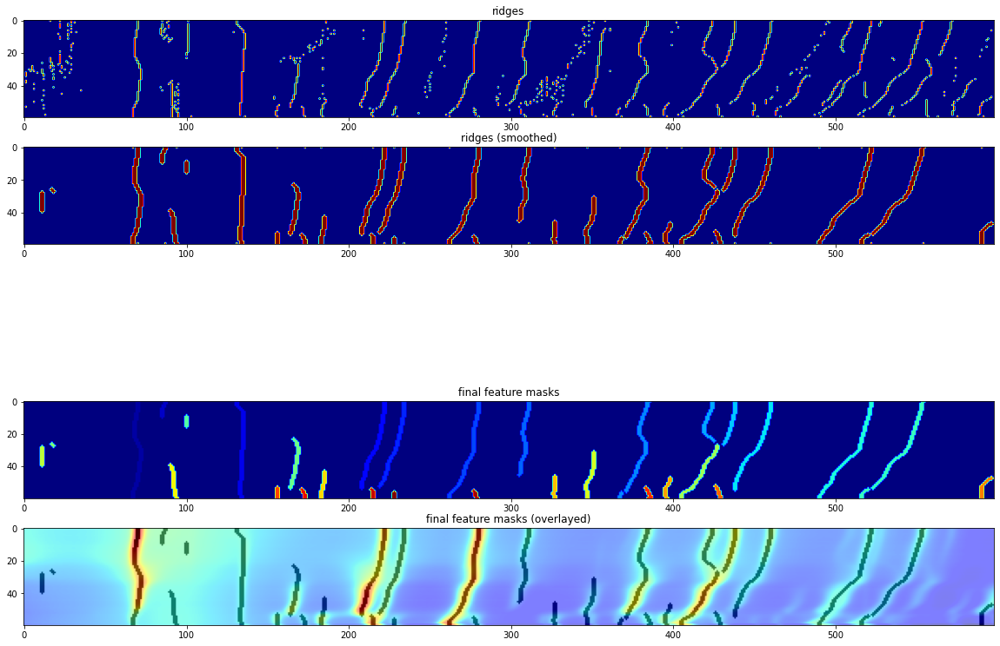

In [7]:
df = pd.read_csv("YijinXRD.dat", sep = '\t')
qq = df.iloc[:, 0]

patterns = df.iloc[:, 2:]
patterns = patterns.values.T
for i in range(len(patterns)):
    patterns[i] = patterns[i] - i * 1000
    
labeled, feature_masks, activations, activations_n0, activations_n1 = feat.get_ridge_features(patterns,
   smooth_ax1 = 'FWHM', smooth_ax0 = 2, threshold_percentile = 50, thicken = True, size_thresh = 2, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    flood_threshold=.95)

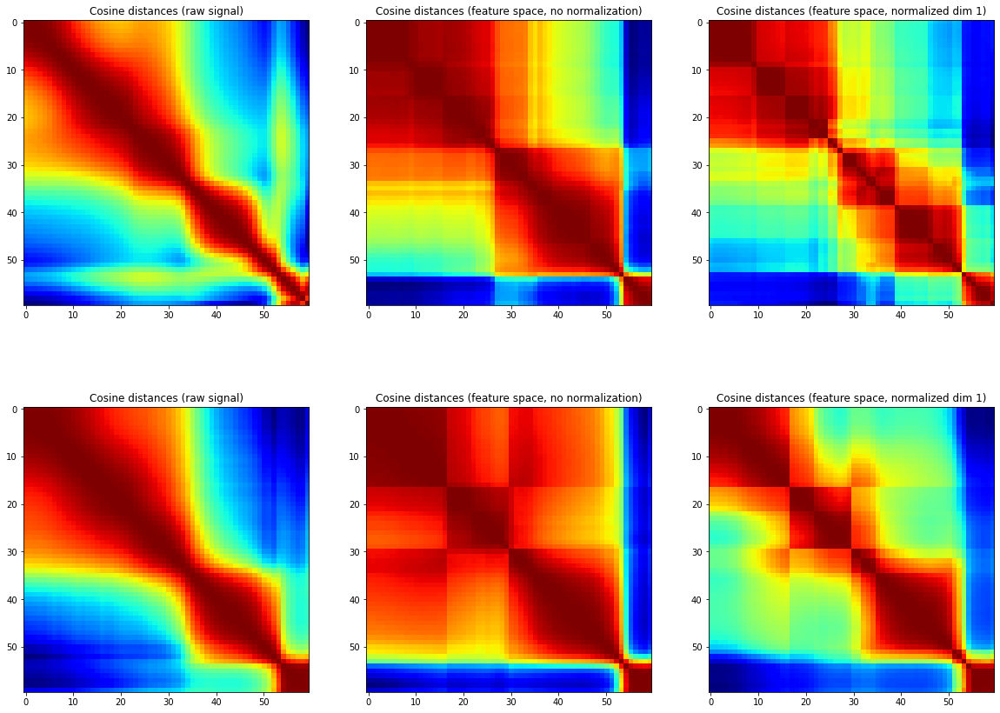

In [313]:
a, b = 2, 3
plt.rcParams["figure.figsize"]=(20, 15)

feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns, activations, activations_n1,
                        a = a, b = b)
feat.similarity_plot_row(feat.csim_pairs, 'Cosine', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed,
                        a = a, b = b, offset = 3)


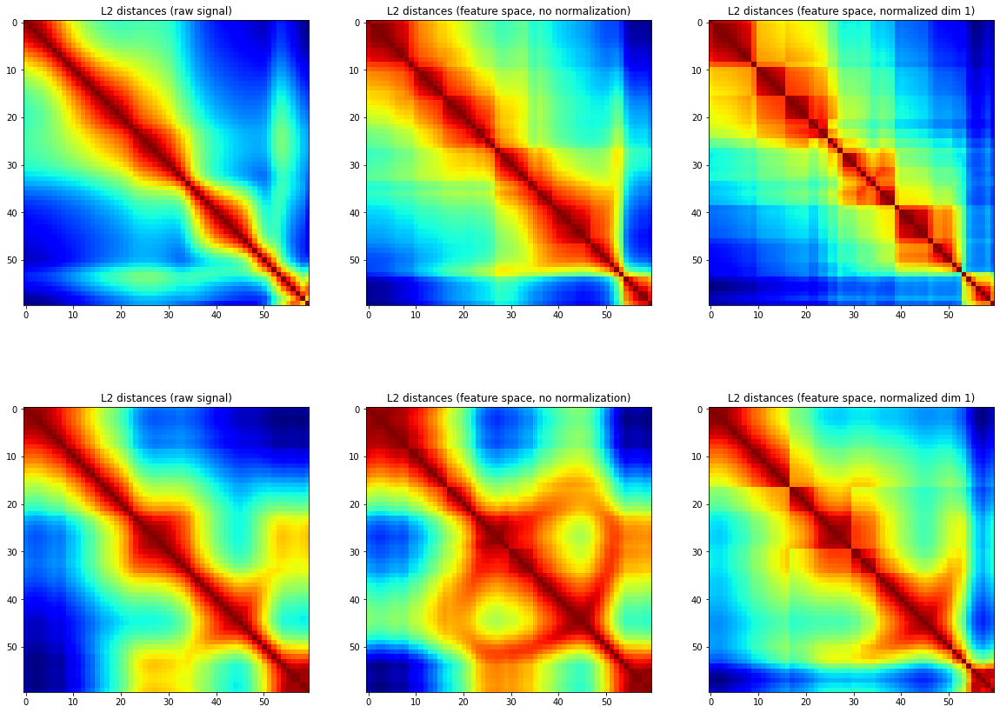

In [314]:
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns, activations, activations_n1,
                        a = a, b = b)
feat.similarity_plot_row(lambda arr: -feat.l2_pairs(arr), 'L2', patterns_pp, activations_bgsubbed, activations_n1_bgsubbed, offset = 3,
                        a = a, b = b)


{'linkage': 'ward', 'affinity': 'euclidean'}


/Users/ollie/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.nearest_centroid module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

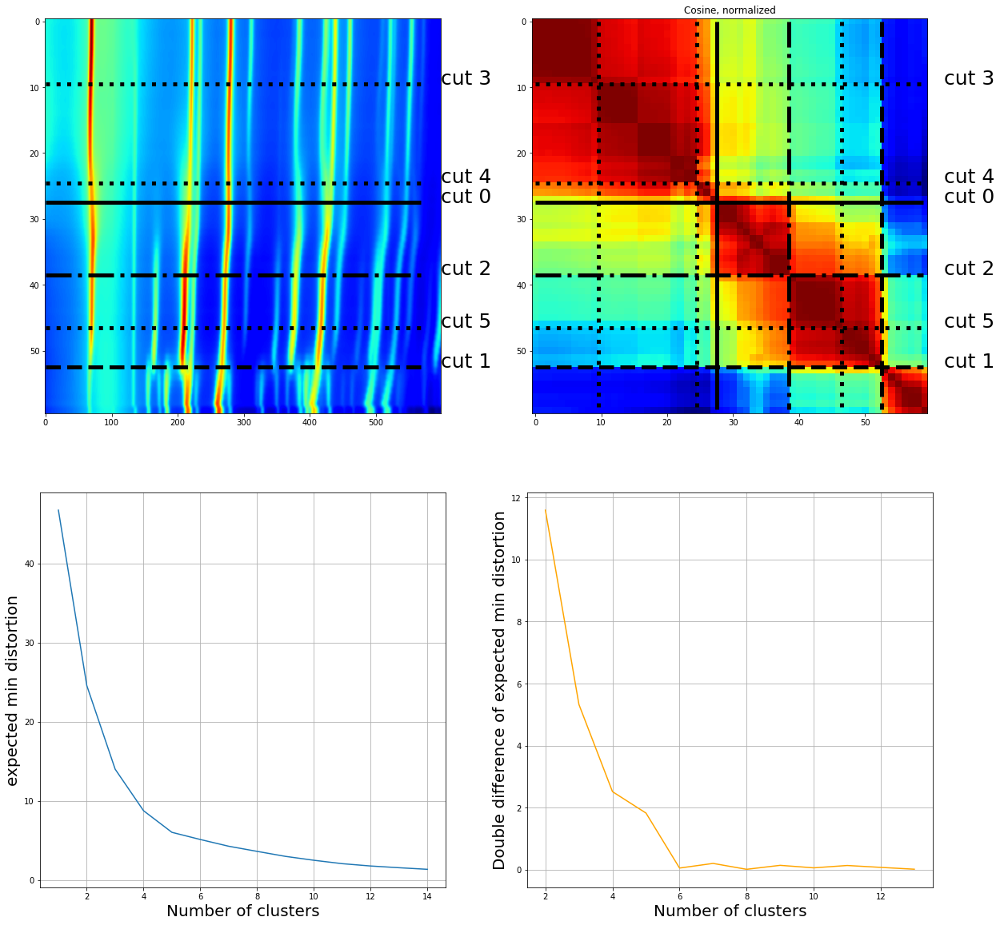

In [48]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns, activations_n1, activations_n1, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

In [318]:
reload(feat)

<module 'xrdc.featurization' from '/Users/ollie/anaconda3/lib/python3.7/site-packages/xrdc-1.0-py3.7.egg/xrdc/featurization.py'>

Based on 2d-smoothed version

## Linear, 2d smooth

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

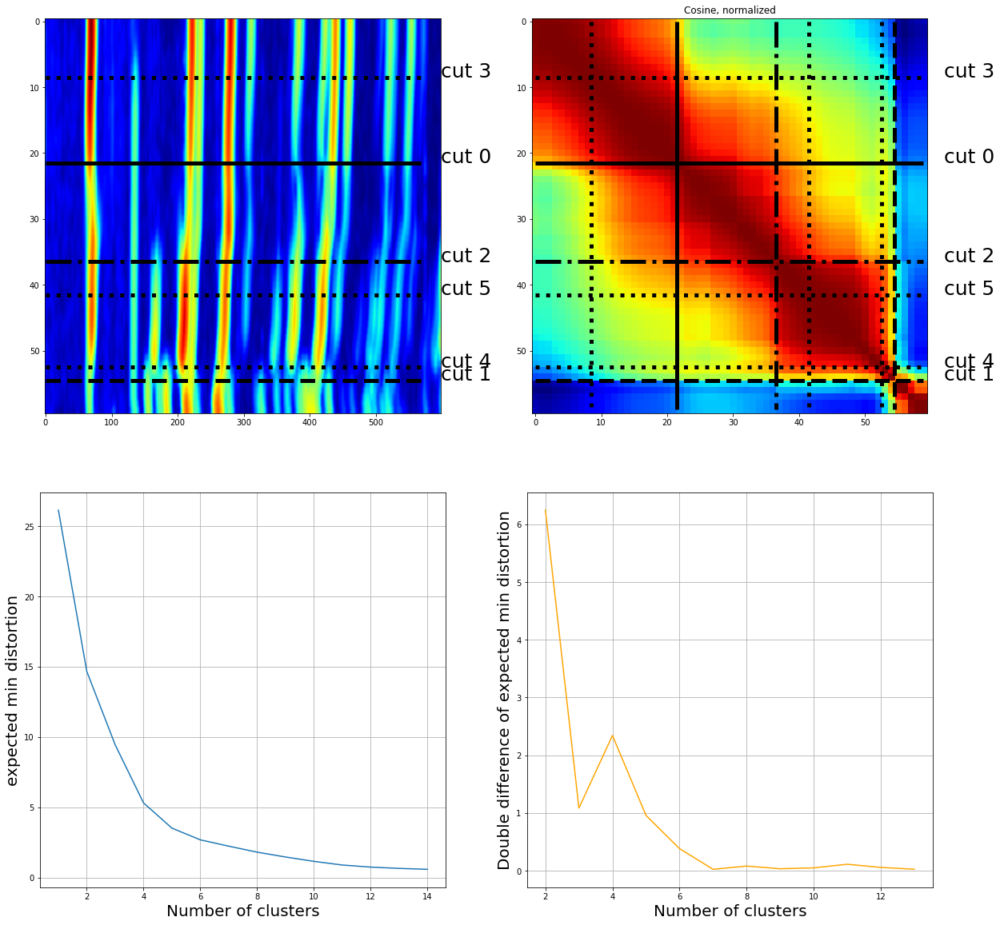

In [53]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed, activations_n1_bgsubbed, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

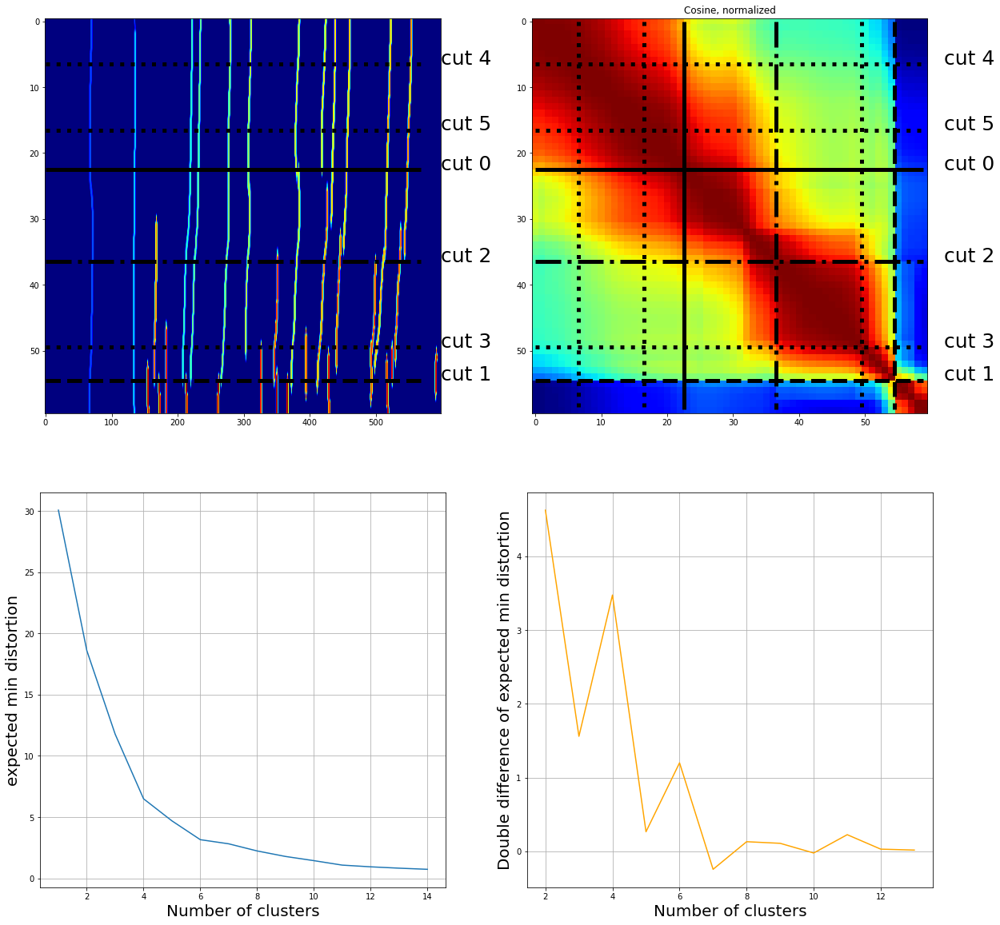

In [186]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(labeled, activations_n1_bgsubbed, activations_n1_bgsubbed, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

## Log, 2d smooth

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

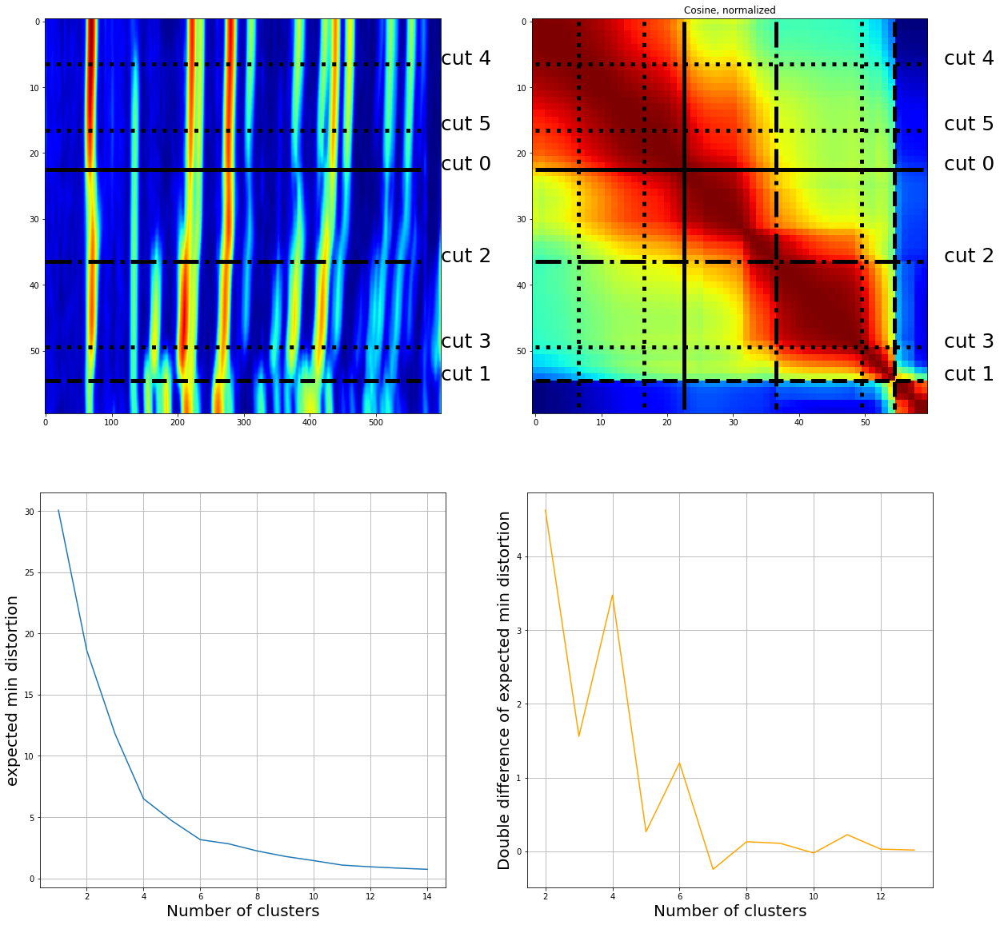

In [145]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed_thick, activations_n1_bgsubbed_thick, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

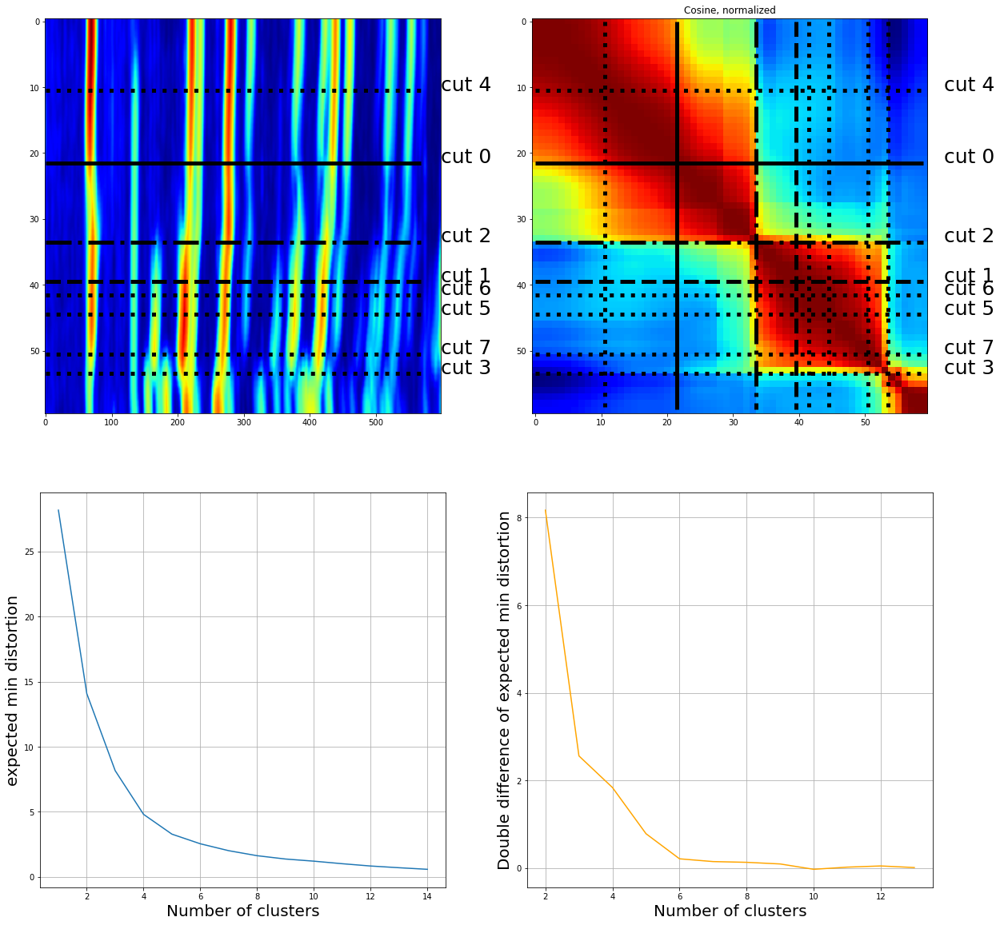

In [323]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed, activations_n1_bgsubbed, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

mark

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

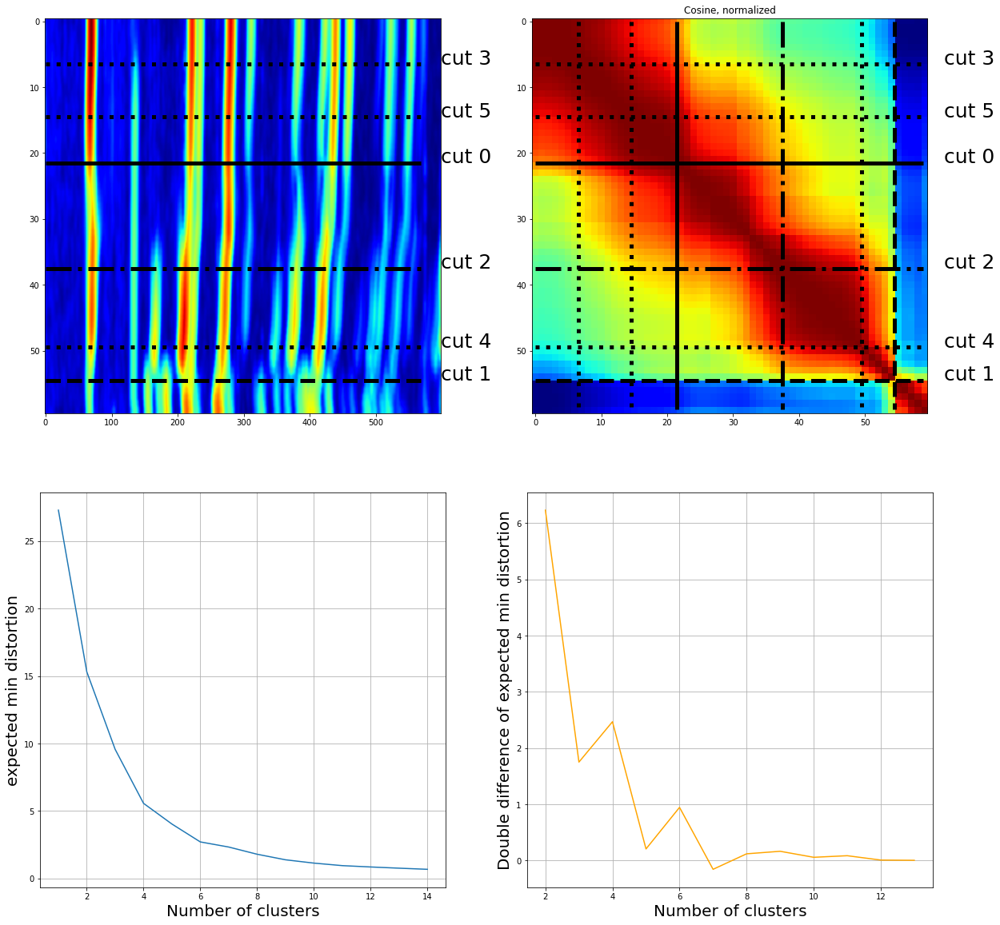

In [120]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed, activations_n1_bgsubbed, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

### Comparison to Chebyshev polynomial background subtraction

In [21]:
with open('data/yijin_cheb_bgsub.npy', 'rb') as f:
    bgsub_cheb = np.load(f)
    
bgsub_cheb_orig = bgsub_cheb.copy()

In [54]:
from matplotlib.widgets import Slider
from pylab import *

In [1070]:
# bad rows: 50, ...
%matplotlib inline
iplot_rows(patterns, bgsub_cheb_orig) 

interactive(children=(IntSlider(value=30, description='i', max=60), Output(layout=Layout(height='550px'))), _d…

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

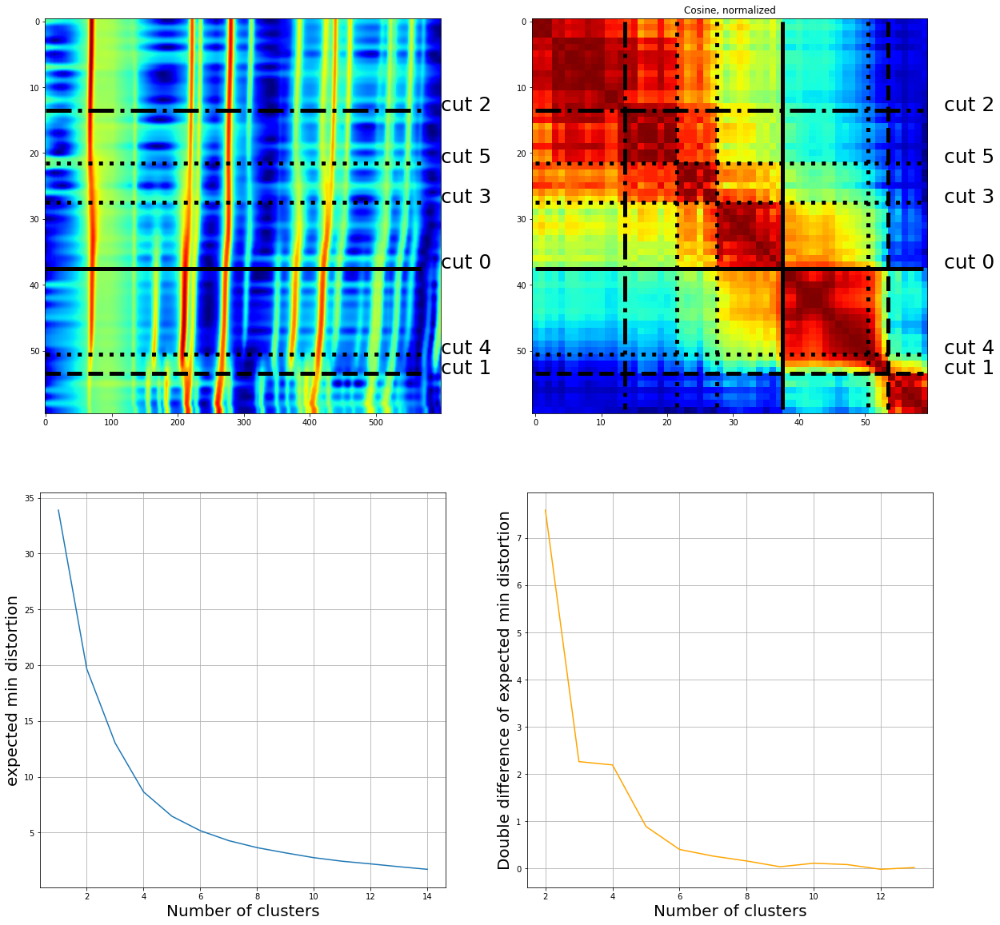

In [50]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(bgsub_cheb, activations_n1_bgsubbed_cheb, activations_n1_bgsubbed_cheb, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

In [26]:
bgsub_cheb  *= (bgsubbed_final.mean() / bgsub_cheb.mean())
#bgsub_cheb2  *= (bgsubbed.mean() / bgsub_cheb2.mean())

In [41]:
plt.rcParams["figure.figsize"]=(20, 13)

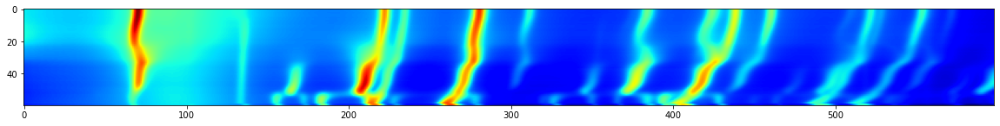

In [46]:
plt.imshow(np.log(1 + patterns * (bgsubbed_final.mean() / patterns.mean())), cmap = 'jet')

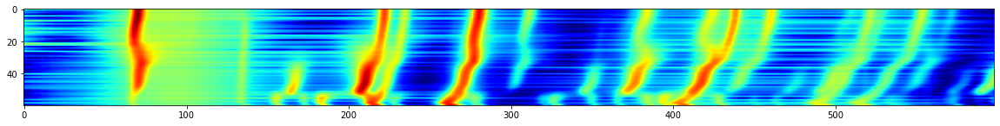

In [42]:
plt.imshow(np.log(1 + bgsub_cheb), cmap = 'jet')

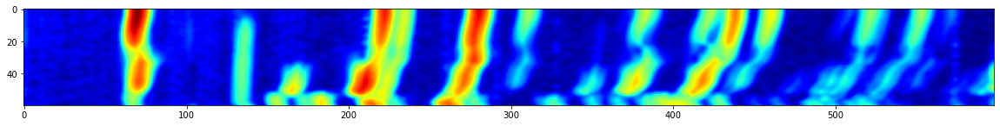

In [43]:
plt.imshow(np.log(1 + bgsubbed_final), cmap = 'jet')

Peak at 70, start iteration with error = 0.7881641895107244
Peak at 70, iteration 0: error = 1.1971069980507931
Peak at 69, start iteration with error = 0.718195032474552
Peak at 69, iteration 0: error = 1.2536229975078566
Peak at 68, start iteration with error = 0.5886848740727058
Peak at 68, iteration 0: error = 0.37305445639681306
Peak at 72, start iteration with error = 0.7655164514080319
Peak at 72, iteration 0: error = 1.2626107950831582
Peak at 211, start iteration with error = 0.7368286283365288
Peak at 211, iteration 0: error = 1.709928075920988
Peak at 208, start iteration with error = 0.8188954984256882
Peak at 208, iteration 0: error = 1.0284661263696457
28
1.8749463904847419


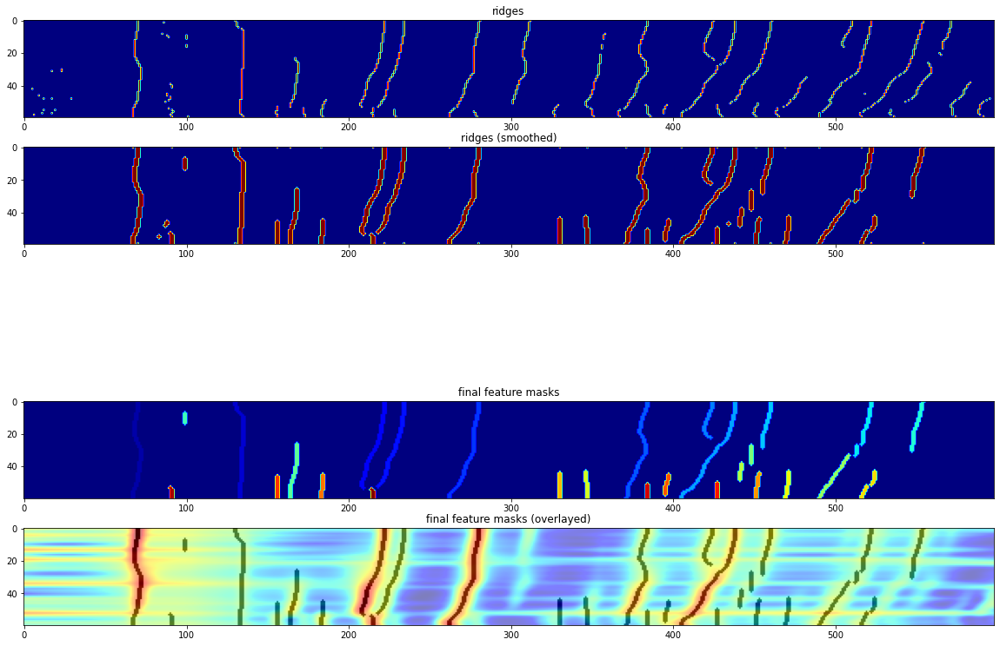

In [288]:
patterns_pp = gf(bgsub_cheb, (1, 1.7))
labeled, feature_masks, activations_bgsubbed_cheb, activations_n0, activations_n1_bgsubbed_cheb = feat.get_ridge_features(
    patterns_pp,
   smooth_ax1 = 'FWHM', smooth_ax0 = 2, threshold_percentile = 75, thicken = True, size_thresh = 5, bgsub=False,
    log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
    thicken_ax0 = 1, thicken_ax1 = 1, flood_threshold=.95, smooth_factor_ax1 = .125)

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

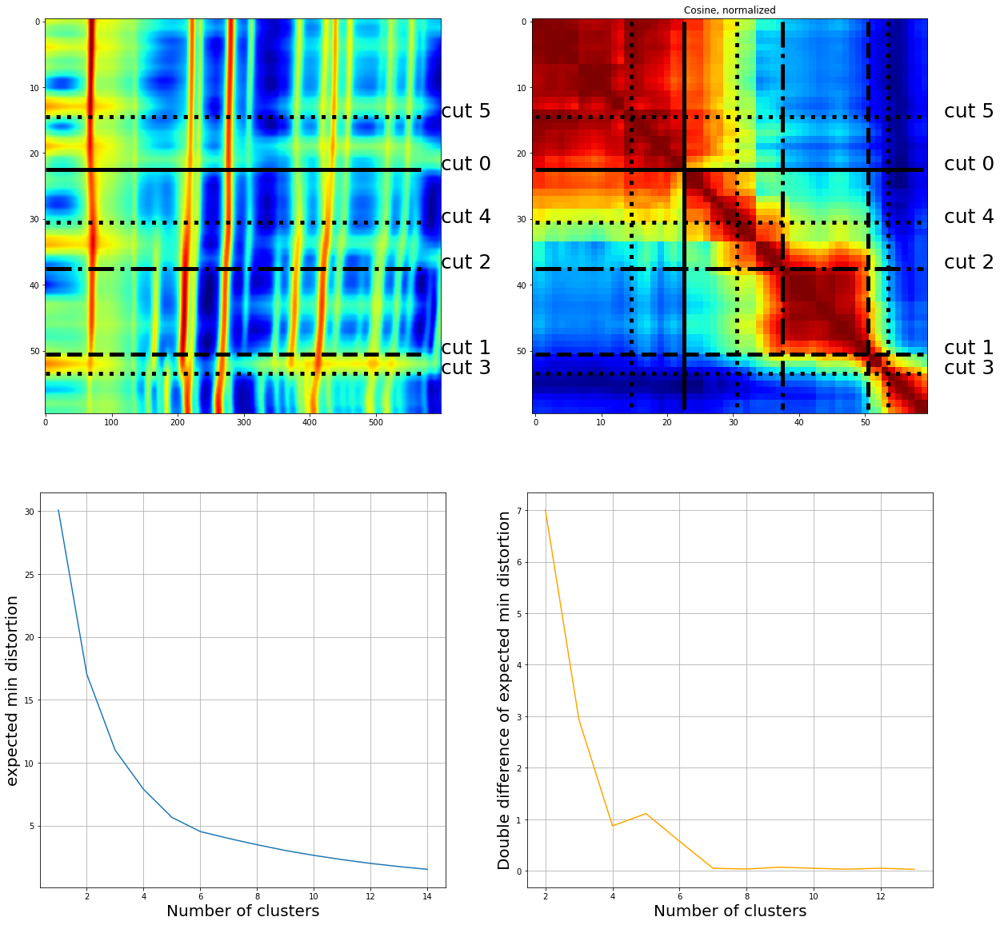

In [289]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed_cheb, activations_n1_bgsubbed_cheb, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

{'linkage': 'ward', 'affinity': 'euclidean'}



    Similarity type: Cosine

    Scaling: linear
    
    Clustering type: agglom
    
    Linkage: ward
    

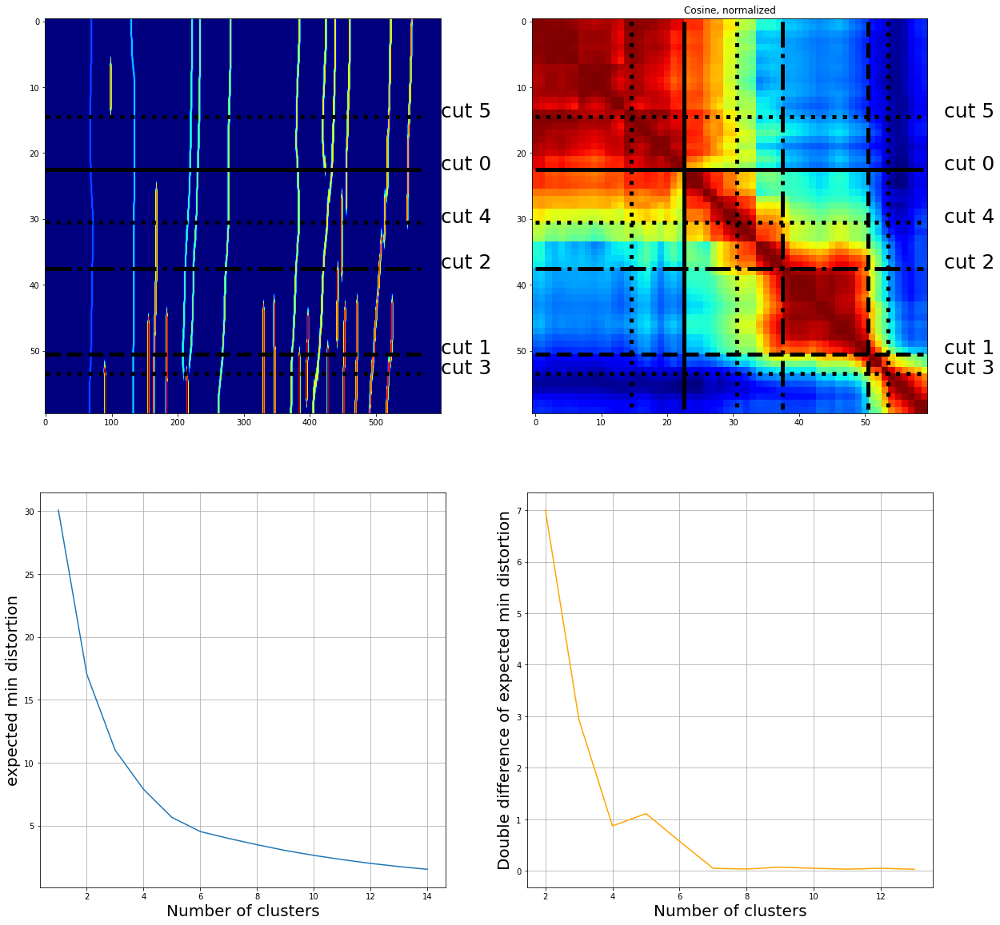

In [290]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(labeled, activations_n1_bgsubbed_cheb, activations_n1_bgsubbed_cheb, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

In [188]:
from importlib import reload
reload(feat)

<module 'xrdc.featurization' from '/Users/ollie/anaconda3/lib/python3.7/site-packages/xrdc-1.0-py3.7.egg/xrdc/featurization.py'>

In [180]:
labeled.max()

29

In [ ]:
results = []

simtype = 'Cosine'
scaling = 'linear'
linkage = 'ward'
ctype = 'agglom'

feature_csims1, o_cuts = feat.sims_with_boundaries(patterns_pp, activations_n1_bgsubbed_cheb, activations_n1_bgsubbed_cheb, n = 7, simtype = simtype, extra_label='',
                    ctype = ctype, linkage = linkage, affinity = 'euclidean')
results.append({'simtype': simtype, 'scaling': scaling, 'linkage': linkage, 'ctype': ctype, 'cut_coords': o_cuts})
feat.printinfo(simtype, scaling, linkage, ctype)

<IPython.core.display.Javascript object>


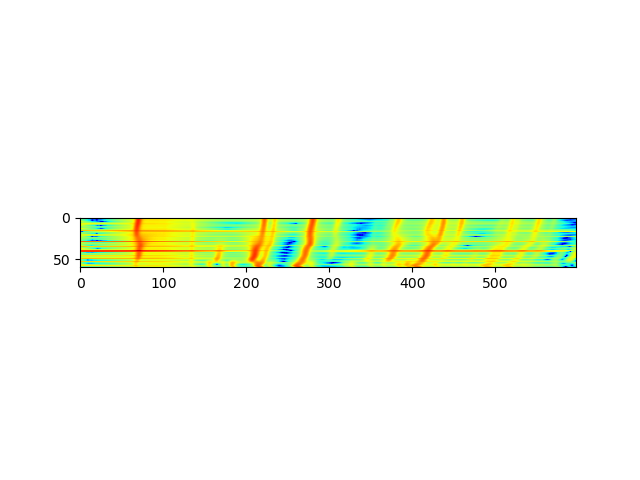

In [90]:
plt.imshow(np.log(1 + gf(bgsub_cheb, 0)), cmap = 'jet')

In [551]:
y2d = np.pad(patterns, 600, mode = 'edge')[500:-500, :]

In [552]:
y2d.shape

(260, 1798)

In [560]:
w2d = (blackman(y2d.shape[0])[:, None] * blackman(y2d.shape[1]))

<IPython.core.display.Javascript object>


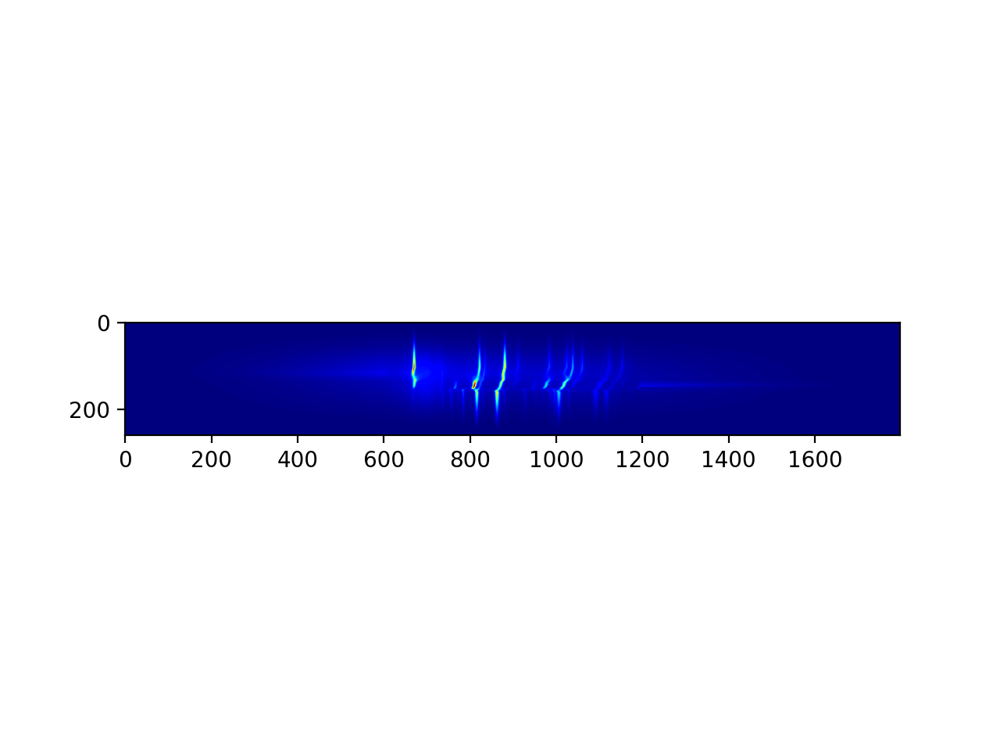

In [561]:
plt.imshow(w2d * y2d, cmap = 'jet')

In [564]:
y2df = fft2(y2d * w2d)

In [649]:
frac1 = .8
frac2 = .01
w2d1 =  mk_black2d(y2d, frac1)
w2d2 =  mk_black2d(y2d, frac2)
y2df = fft2(y2d * w2d1)

sig = if_mag(w2d2 * y2df)


# window, ywf = spec_fft(10, 1000)
# sig = if_mag(clip_low(ywf, .001) * window)

In [126]:
def mk_black2d(y2d, fraction):
    N, M = y2d.shape
    n = m = fraction
    nwin, mwin = 2 * (int(n * N) // 2), 2 * (int(m * M) // 2)
    w2d = blackman(nwin)[:, None] * blackman(mwin)
    w2d = np.pad(w2d, (M - mwin) // 2)
    w2d = np.sqrt(1e-9 + w2d)
    trim = w2d.shape[0] - N
    w2d = w2d[trim // 2: -trim // 2]
    return w2d

def clip_low2d(x, frac_zero):
    N = len(x)
    nz = int(frac_zero * N)
    x2  = x.copy()
    x2[:( nz) // 2 ] = 0
    x2[(-nz) // 2:] = 0
    return x2

window, ywf = spec_fft(patterns, 10, 1000)
sig = if_mag(clip_low(ywf, .001) * window)

def spec_fft2(do_window = True):
    if do_window:
        ywf = fft2(y*w)
    else:
        ywf = fft2(y)
    if do_conv_window:
        ywf = conv_window(ywf)
    return w, ywf

def if_mag(patterns, arr, phase = 0, truncate = False):
    trunc = len(arr) - len(patterns[0])
    phase = np.exp(1j * phase)
    tmp = ifft2(arr)
    if truncate:
        return np.real(np.sqrt(np.conjugate(tmp * phase) * tmp))[trunc // 2: -trunc // 2]
    return np.real(np.sqrt(np.conjugate(tmp * phase) * tmp))

In [334]:
i = 1
window, ywf = spec_fft(patterns, i, 1000)
sig = if_mag(patterns, clip_low(ywf, .001) * window)

i = 2
window, ywf = spec_fft(patterns, i, 1000, roll = 0, log = False)
sig2 = if_mag(clip_low(ywf, .001) * window)
tmp = np.real(np.sqrt(fftshift(fft(window)) * np.conjugate(fftshift(fft(window)))))
sig2 = np.convolve(sig2, tmp / tmp.max()) * .6
sig2 =  gf(sig2, 1.5)

sigg = gf(sig, 1.5)
plt.plot(sig)
plt.plot(sigg)
plt.plot(sig2, label = 'cmp')

y0 = patterns[i]
#plt.plot(600 * y0 / y0.max())
# plt.plot(1 + sig)
# plt.plot(1 + sigg)
plt.plot(600 * y / y.max())
#plt.semilogy()
plt.xlim((1000, 1500))
plt.legend()

TypeError: if_mag() missing 1 required positional argument: 'arr'

<IPython.core.display.Javascript object>


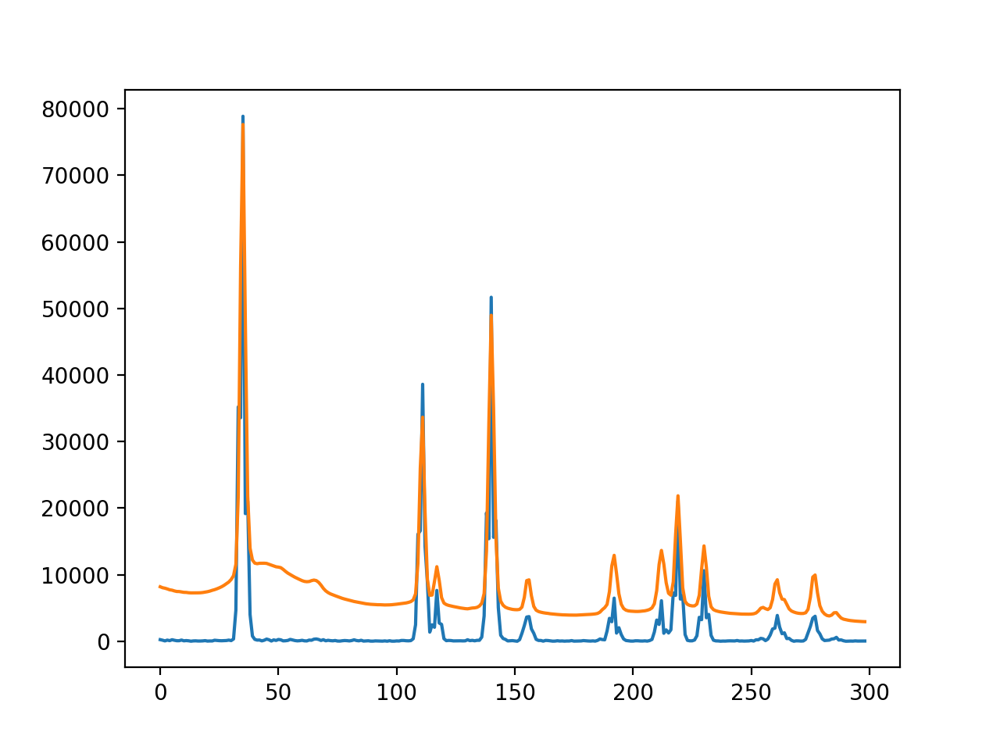

In [460]:
plt.plot(50 * sig[1000: -1000].reshape((-1, 2)).sum(axis = 1))
plt.plot(patterns[0].reshape((-1, 2)).sum(axis = 1))

In [903]:
lowpass_g(10, y)

array([1.        , 0.99985379, 0.99941527, ..., 0.99868484, 0.99941527,
       0.99985379])

In [947]:
%matplotlib notebook

<IPython.core.display.Javascript object>


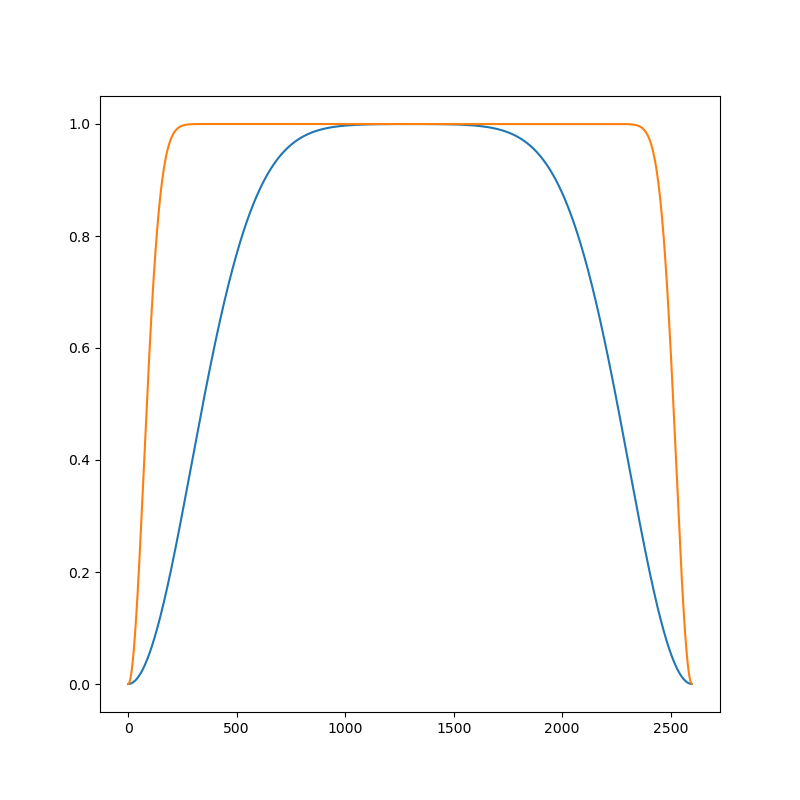

In [983]:
plt.plot(highpass_g(1, ywf))
plt.plot(highpass_g(4, ywf))

In [82]:
%matplotlib notebook

<IPython.core.display.Javascript object>


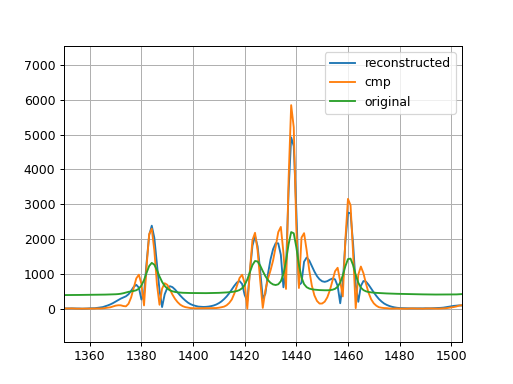

In [160]:
i = 1
cutoff = 4
window, ywf = spec_fft(patterns, i, 1000)
sig = if_mag(patterns, highpass_g(cutoff, ywf) * ywf)

i = 2
window, ywf = spec_fft(patterns, i, 1000, roll = 0, log = False, do_window=False)
sig2 = if_mag(highpass_g(.5 * cutoff, ywf) * ywf)
#tmp = np.real(np.sqrt(fft(window) * np.conjugate(fft(window))))
#sig2 = np.convolve(sig2, tmp / tmp.max()) * .6
#sig2 =  gf(sig2, 1.5)

sigg = gf(sig, 1.5)
plt.plot(sig, label = 'reconstructed')
#plt.plot(sigg, label = 'smoothed')
plt.plot(sig2 * (sig.mean() / sig2.mean()), label = 'cmp')

y0 = patterns[i]
#plt.plot(600 * y0 / y0.max())
# plt.plot(1 + sig)
# plt.plot(1 + sigg)
plt.plot(8000 * y / y.max(), label = 'original')
#plt.semilogy()
#plt.xlim((1000, 1500))
plt.legend()
plt.grid()
# i = 1
# window, ywf = spec_fft(i, 1000)
# sig = if_mag(ywf * highpass_g(.1, y))

# i = 2
# window, ywf = spec_fft(i, 1000, roll = 0, log = False)
# sig2 = if_mag(lowpass_g(10, y) * window)
# # sig2 = np.convolve(sig2, tmp / tmp.max()) * .6
# # sig2 =  gf(sig2, 1.5)

# sigg = gf(sig, 1.5)
# plt.plot(sig, label = 'sig')
# # plt.plot(sigg)
# # plt.plot(sig2, label = 'cmp')

# y0 = patterns[i]
# #plt.plot(600 * y0 / y0.max())
# # plt.plot(1 + sig)
# # plt.plot(1 + sigg)

# #plt.plot(600 * y / y.max())

# #plt.semilogy()
# plt.xlim((1000, 1500))
# plt.legend()

<IPython.core.display.Javascript object>


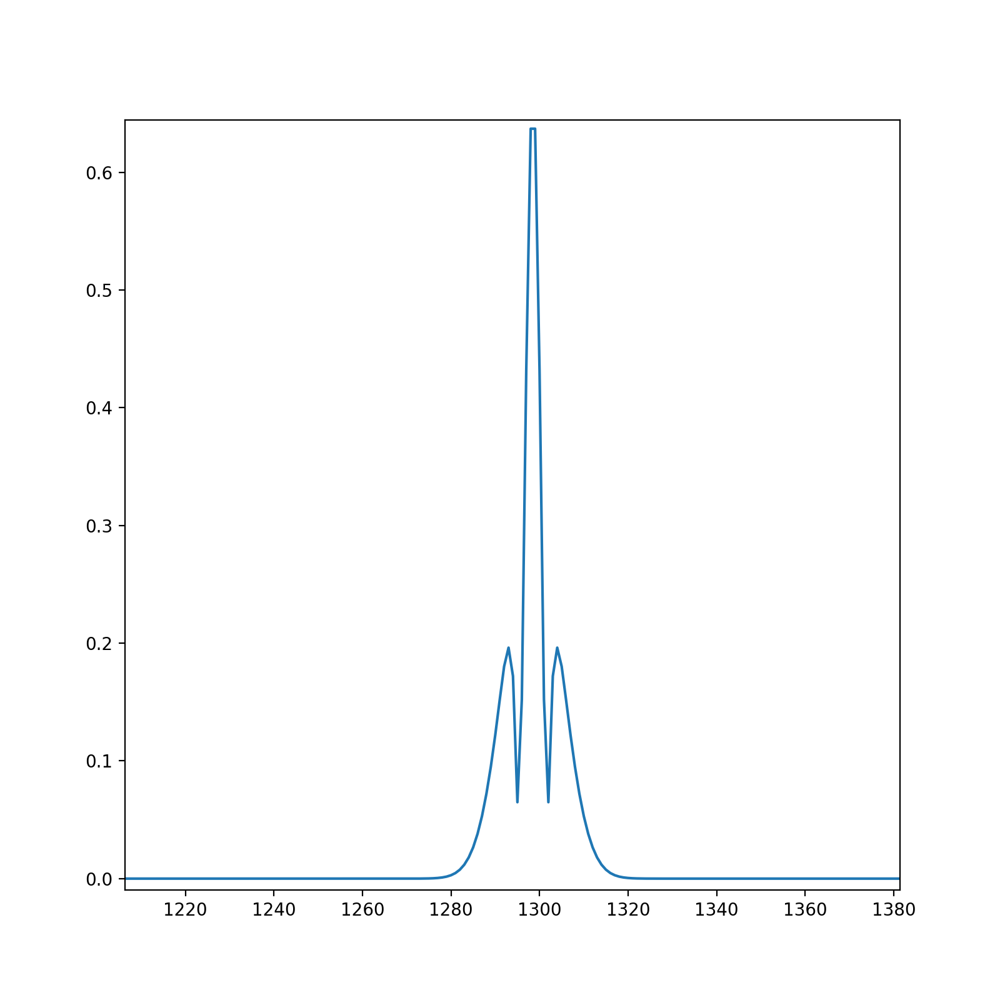

In [1164]:
plt.plot(psf.ravel())

In [1253]:
from chart_studio import plotly as py

In [1256]:
%matplotlib inline

In [268]:
%matplotlib notebook

<IPython.core.display.Javascript object>


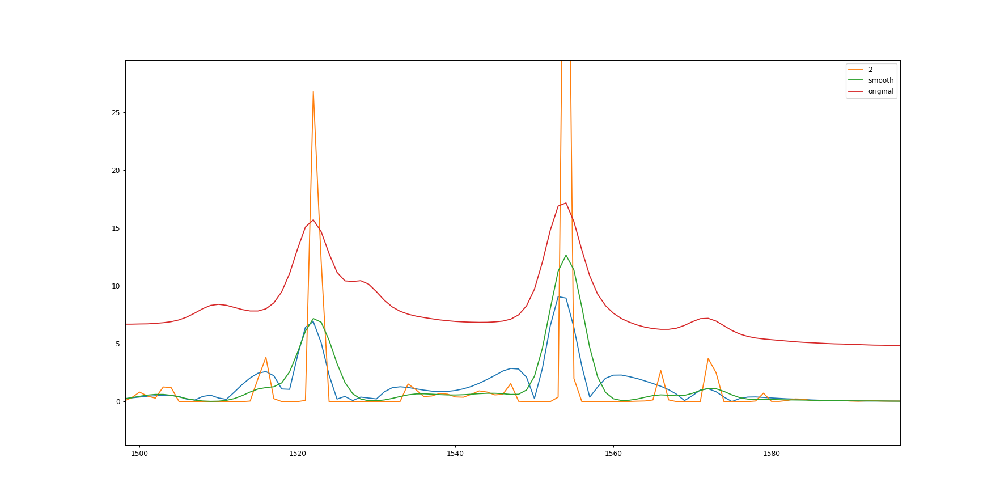

0.5089248279814097
0.5089248279814097


In [269]:
i = 1
cutoff = 4.
window, ywf = spec_fft(patterns, i, 1000)
sig = if_mag(highpass_g(cutoff, ywf) * ywf)


offset = 0
plt.plot(offset + sig / sig.mean())
tmp = do_rl(sig, cutoff, 2.2)
print(tmp.max())
#plt.plot( tmp / tmp.mean(), label = '1')
tmp = do_rl(sig, cutoff, 2.2)
print(tmp.max())
plt.plot(offset + tmp / tmp.mean(), label = '2')
plt.plot(offset +  gf(tmp, 2.1) / tmp.mean(), label = 'smooth')
plt.plot(10 * y / y.mean(), label = 'original')

plt.legend()

#plt.semilogy()


In [157]:
cutoff = 2
width = 2.4
plot_df([sig / sig.mean(), 'filtered'],
        [do_rl(sig, cutoff, width) / do_rl(sig, cutoff, width).mean(), 'filtered + deconvolved'],
        [gf(do_rl(sig, cutoff, width) / do_rl(sig, cutoff, width).mean(), 2.3), 'filtered + deconvolved + smoothed'],
        [10 * y / y.mean(), 'original'])

In [274]:
cutoff = 2
width = 2.4
plot_df([sig / sig.mean(), 'filtered'],
        [do_rl(sig, cutoff, width, norm = True, window_type = 'step', bwindow = window), 'filtered + deconvolved'],
        [gf(do_rl(sig, cutoff, width, norm = True, window_type = 'step', bwindow = window), 2.3), 'filtered + deconvolved + smoothed'],
        [10 * y / y.mean(), 'original'])

In [1177]:
psf.max()

0.637055301486221

In [1184]:
deconvolved_RL = restoration.richardson_lucy((sig[:, None].T) / (10 * sig.max()), psf_1d, iterations=30)


In [1185]:
deconvolved_RL.max()

0.4125853496097935

In [1202]:
%matplotlib notebook

In [1196]:
deconvolved_RL[0].max()

0.4125853496097935

In [1139]:
deconvolved_RL.shape

(1, 512)

In [1089]:
imp = np.ones_like(patterns[0])
imp[len(imp) // 2] = 10
#imp = patterns[0].copy()
imp[len(imp) // 4] = 10
imp += np.arange(len(imp))

imp = signal.gaussian(len(y), std = 10)

In [1090]:
c, d = spec_fft(0, 1000, dat  = imp)

In [1091]:
d

array([ 25.06436301-0.j        , -25.06201746-0.01712368j,
        25.0549821 +0.03423775j, ..., -25.04326089+0.05133265j,
        25.0549821 -0.03423775j, -25.06201746+0.01712368j])

<IPython.core.display.Javascript object>


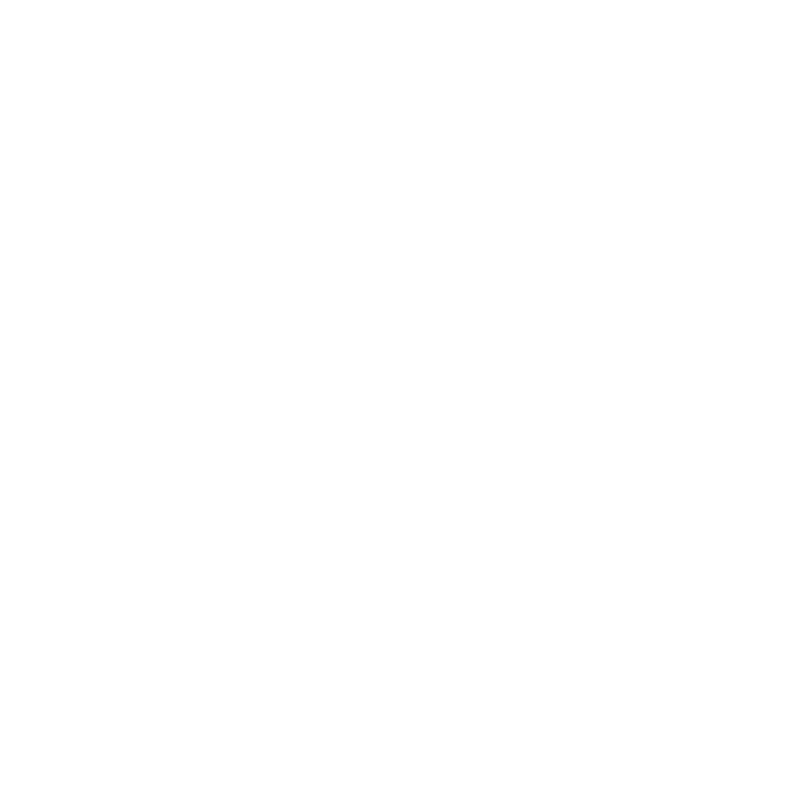

In [1088]:
t = np.linspace(0, 1, len(y))
triangle = signal.gaussian(len(y), std = 10)
plt.plot(triangle)

<IPython.core.display.Javascript object>


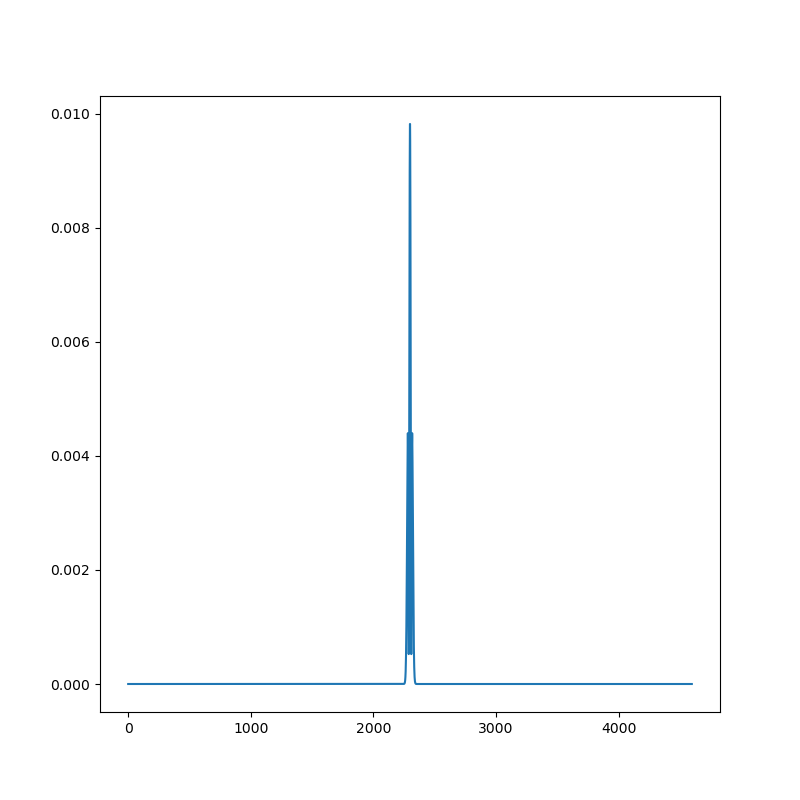

In [1093]:
plt.plot(if_mag(highpass_g(1, d) * d))

In [ ]:
signal.cau

<IPython.core.display.Javascript object>


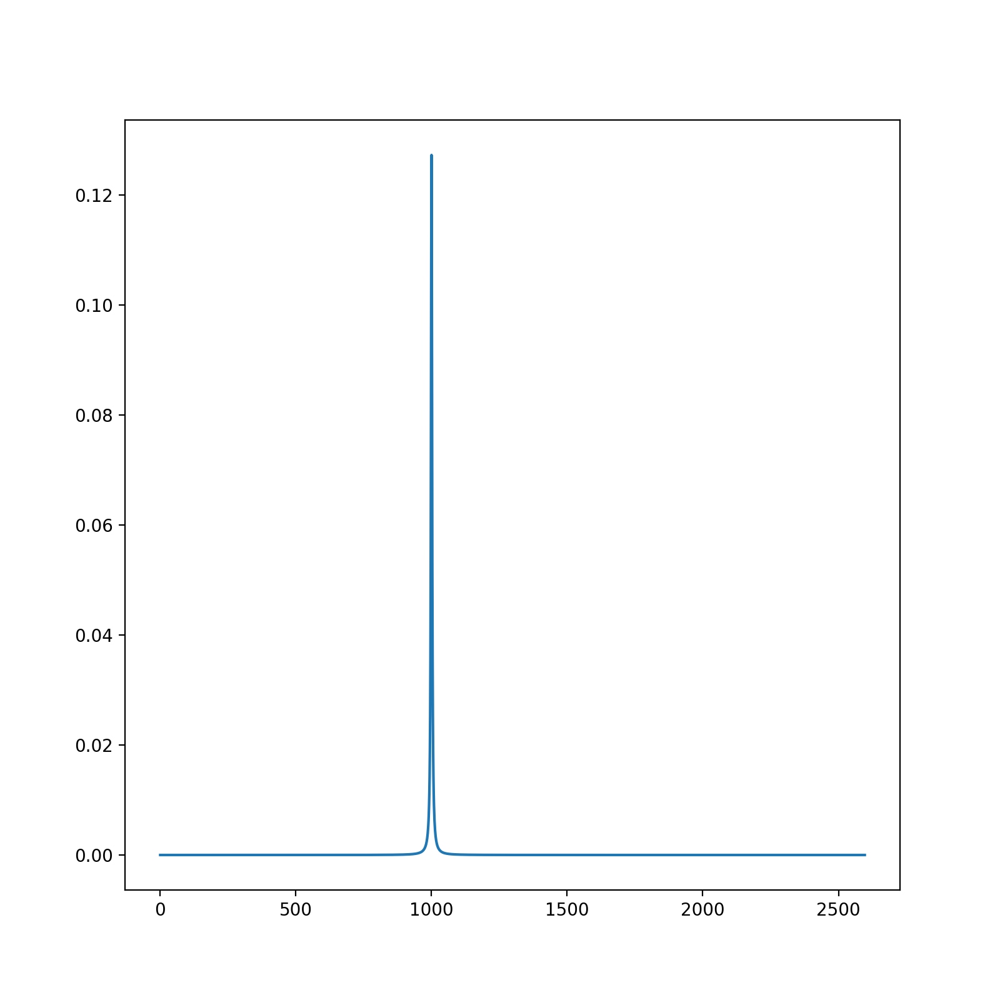

In [1149]:
l = lorenz(2.5, np.arange(len(y)), 1000)
plt.plot(l)

In [60]:
gwindow.max()

0.9922179382602435

In [61]:
fft

<function numpy.fft.fft(a, n=None, axis=-1, norm=None)>

In [66]:
%matplotlib notebook

In [335]:
# window function
gwindow = signal.gaussian(len(y), std = 4)

L = power(fftshift(fft(gwindow)))
L /= L.max()
H = 1 - L

H2 = clip_low_window(ywf, .001) * window

# peak shape
g = signal.gaussian(len(y), std = 2)
#g = l

gfft = fftshift(fft(g))

a, b = 2, 3

plt.subplot(a, b, 1)
plt.plot(g)
plt.subplot(a, b, 2)
plt.plot(mag(gfft))
plt.subplot(a, b, 3)
plt.plot(H, label = 'filter')
plt.plot(mag(gfft) / mag(gfft).max(), label = 'peak power spectrum')

plt.legend()

plt.subplot(a, b, 4)
plt.plot(mag(ifft(ifftshift(gfft))))

plt.subplot(a, b, 5)
plt.plot(mag(ifft(ifftshift(gfft * H))))
plt.legend()

<IPython.core.display.Javascript object>

In [254]:
%matplotlib notebook

In [329]:
from xrdc import xrdutils

In [330]:
curve = 2 * xrdutils.mk_generate_peak_scales(np.arange(N), sigma_peakvar = 400)(N) - 1

In [183]:
%matplotlib notebook

In [192]:
y.shape

(2598,)

In [772]:
def _getN(x):
    return(len(x))
    b = 0.001  # Transition band, as a fraction of the sampling rate (in (0, 0.5)).
    N = int(np.ceil((4 / b)))
    if not N % 2: N += 1  # Make sure that N is odd.
    return N

def lowpass(x, fc):
    N = _getN(x)
    print(N)
    #N = len(x)
    n = np.arange(N)
    assert (N % 2) # must be odd
    # Compute a low-pass filter.
    h = np.sinc(2 * fc * (n - (N - 1) / 2))
    w = np.blackman(N)
    w = 1
    h = h * w
    h = h / np.sum(h)
    return h

def highpass(x, fc):
    #N = len(x)
    N = _getN(x)
    assert (N % 2) # must be odd
    # Create a high-pass filter from the low-pass filter through spectral inversion.
    h = -lowpass(x, fc)
    h[(N - 1) // 2] += 1
    return h

In [773]:
pat = xrdpad(patterns[0])

In [774]:
s_H = highpass(pat, .0001)

1791


In [768]:
np.convolve?

<IPython.core.display.Javascript object>


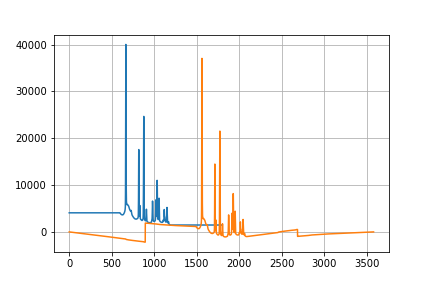

In [775]:
plt.plot(pat)
plt.plot(np.convolve(pat, s_H))
plt.grid()

In [629]:
pat.shape

(1791,)

In [630]:
s_H.shape

(4001,)

<IPython.core.display.Javascript object>


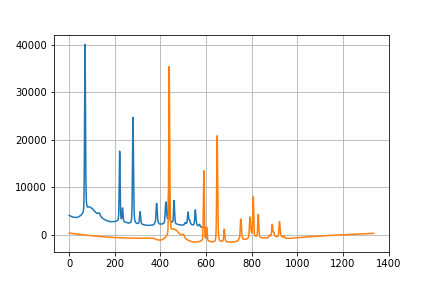

In [616]:
plt.plot(patterns[0])
plt.plot(xrdtrunc(np.convolve(xrdpad(patterns[0]), s_H, 'same')))
plt.grid()

<IPython.core.display.Javascript object>


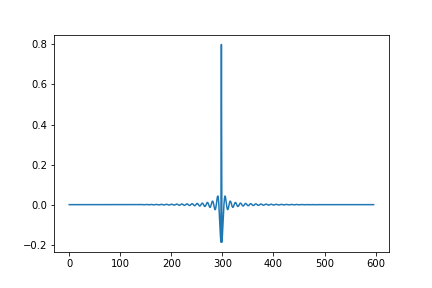

In [505]:
plt.plot(highpass(patterns[0], .1))

<IPython.core.display.Javascript object>


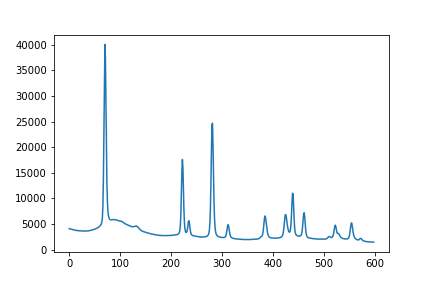

In [407]:
plt.plot(patterns[0])

In [384]:
%pdb

Automatic pdb calling has been turned ON


In [663]:
def mkdelta(N):
    #assert N % 2
    delta = np.zeros(N)
    delta[N // 2] = 1
    return delta

In [674]:
mkdelta(2)

array([0., 1.])

In [672]:
fft(mkdelta(3))

array([ 1. +0.j       , -0.5-0.8660254j, -0.5+0.8660254j])

In [435]:
N = len(y)
delta1, delta2 = np.zeros(N), np.zeros(N)
delta1[N // 2] = 1
delta2[N // 2 + 1] = 1

<IPython.core.display.Javascript object>


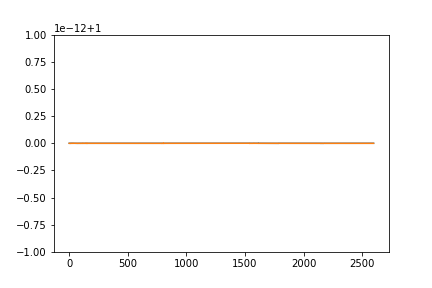

In [438]:
plt.plot(np.absolute(fft(delta1)))
plt.plot(np.absolute(fft(delta2)))

In [678]:
deltafft = fftshift(fft(mkdelta(101))) * blackman(101)

In [679]:
np.angle(deltafft)

array([ 1.58634877e+00,  1.61745364e+00, -1.49303413e+00,  1.67966340e+00,
       -1.43082438e+00,  1.74187315e+00, -1.36861462e+00,  1.80408291e+00,
       -1.30640487e+00,  1.86629267e+00, -1.24419511e+00,  1.92850242e+00,
       -1.18198535e+00,  1.99071218e+00, -1.11977560e+00,  2.05292193e+00,
       -1.05756584e+00,  2.11513169e+00, -9.95356088e-01,  2.17734144e+00,
       -9.33146333e-01,  2.23955120e+00, -8.70936577e-01,  2.30176095e+00,
       -8.08726822e-01,  2.36397071e+00, -7.46517066e-01,  2.42618047e+00,
       -6.84307311e-01,  2.48839022e+00, -6.22097555e-01,  2.55059998e+00,
       -5.59887800e-01,  2.61280973e+00, -4.97678044e-01,  2.67501949e+00,
       -4.35468289e-01,  2.73722924e+00, -3.73258533e-01,  2.79943900e+00,
       -3.11048778e-01,  2.86164875e+00, -2.48839022e-01,  2.92385851e+00,
       -1.86629267e-01,  2.98606826e+00, -1.24419511e-01,  3.04827802e+00,
       -6.22097555e-02,  3.11048778e+00,  3.33066907e-16, -3.11048778e+00,
        6.22097555e-02, -

<IPython.core.display.Javascript object>


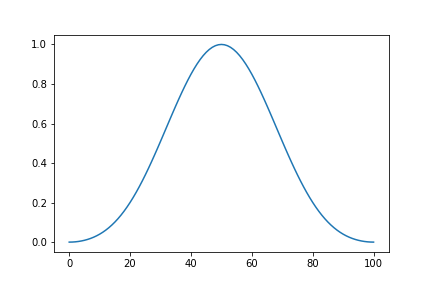

In [681]:
#plt.plot(np.angle(deltafft))
plt.plot(np.absolute(deltafft))

<IPython.core.display.Javascript object>


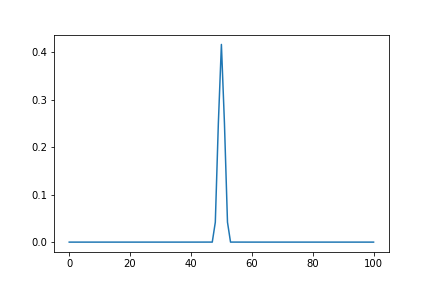

In [683]:
plt.plot(np.absolute(ifft(deltafft)))

In [4]:
# def spec_separate(patterns, pad = None, i = 0, ftype = 'step', std = 4, cutoff = .9):
#     """
#     separate signal into low and high-frequency components
#     """
#     N = len(patterns[0])
#     if pad is None:
#         pad = N
    
#     g = y = np.pad(patterns[i], pad, mode = 'edge')

#     window, ywf = spec_fft(patterns, i, pad)

    
#     if ftype == 'step':
#         L = clip_high_window(ywf, cutoff)
#         H = 1 - L
#     elif ftype == 'gaussian':
#         gwindow = signal.gaussian(len(y), std = std)

#         L = np.absolute(fftshift(fft(gwindow)))
#         L /= np.absolute(L).max()
#         H = 1 - L
#     else:
#         raise Exception
#     gfft = fftshift(fft(g))

    
#     low = np.real(ifft(ifftshift(gfft * L)))[pad: -pad]
#     high = np.real(ifft(ifftshift(gfft * H)))[pad: -pad]

#     return high, low, (g, gfft, H, L)

def spec_separate(patterns, pad = None, i = 0, ftype = 'step', std = 4, cutoff = .9,
        window_high = False):
    """
    separate signal into low and high-frequency components
    """
    N = len(patterns[0])
    if pad is None:
        pad = N
    
    g = y = np.pad(patterns[i], pad, mode = 'edge')

    window, ywf = spec_fft(patterns, i, pad)

    
    if ftype == 'step':
        L = clip_high_window(ywf, cutoff)
        H = 1 - L
    elif ftype == 'gaussian':
        gwindow = signal.gaussian(len(y), std = std)

        L = np.absolute(fftshift(fft(gwindow))) * window
        L /= np.absolute(L).max()
        H = 1 - L
    else:
        raise Exception
    if window_high:
        H = H * window
    gfft = fftshift(fft(g))

    
    low = np.real(ifft(ifftshift(gfft * L)))[pad: -pad]
    high = np.real(ifft(ifftshift(gfft * H)))[pad: -pad]

    return high, low, (g, gfft, H, L)

def separate_2d(arr, **kwargs):
    high = []
    low = []
    for i in range(len(arr)):
        h, l, _ = spec_separate(arr, i = i, **kwargs)
        high.append(h)
        low.append(l)
    return np.vstack(high), np.vstack(low)

In [5]:
# high, low, (x, _, _, _) = spec_separate(patterns.T, i = 50, ftype = 'gaussian')

In [79]:
highlow_T = separate_2d(patterns.T, ftype = 'gaussian', std = .5)

<IPython.core.display.Javascript object>


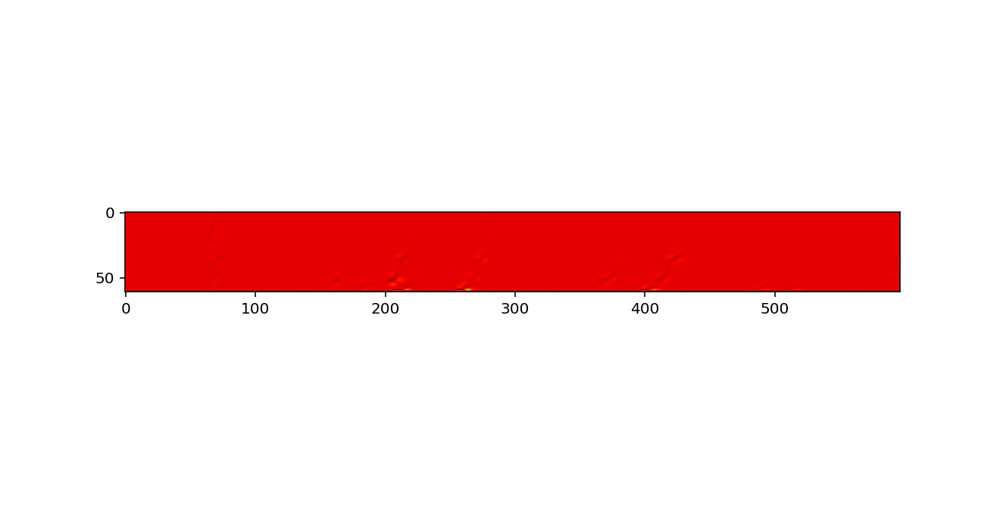

In [902]:
logim((highlow_T[0].T), offset = 1 - (highlow_T[0].T).min())

mark 1

## High frequency T

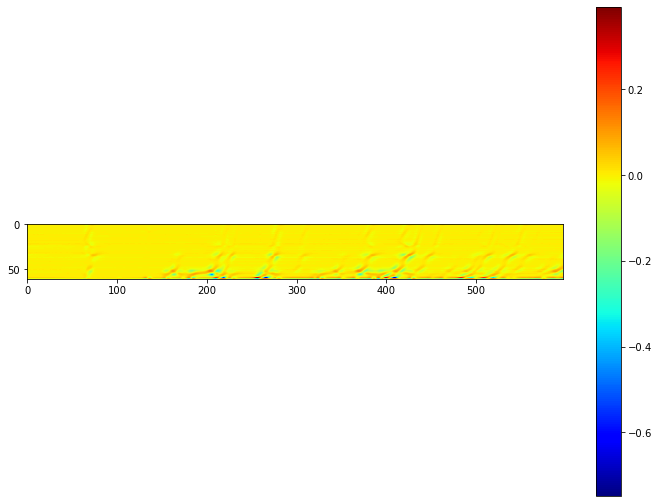

In [9]:
plt.rcParams["figure.figsize"]=(12, 9)
plt.imshow((highlow_T[0].T) / patterns, cmap = 'jet')
plt.colorbar()

In [10]:
%matplotlib inline
iplot_rows(highlow_T[0], patterns.T, 'high-freq', 'raw', log = False, offset = 1)

interactive(children=(IntSlider(value=30, description='i', max=60), Output(layout=Layout(height='550px'))), _d…

In [72]:
iplot_rows(highlow_T[0], label1 = 'high-freq', log = False)

interactive(children=(IntSlider(value=298, description='i', max=597), Output(layout=Layout(height='550px'))), …

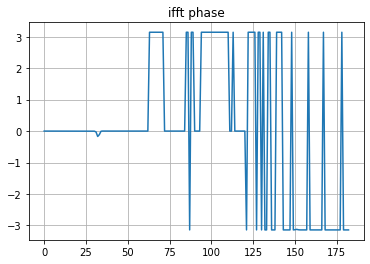

In [1069]:
# a, b = 2, 1
# plt.subplot(a, b, 1)
plt.plot(np.angle(ifth))
plt.title('ifft phase')
plt.grid()
# plt.subplot(a, b, 2)
# plt.plot(np.sign(np.real(ifth)))
# plt.grid()

## Low frequency T

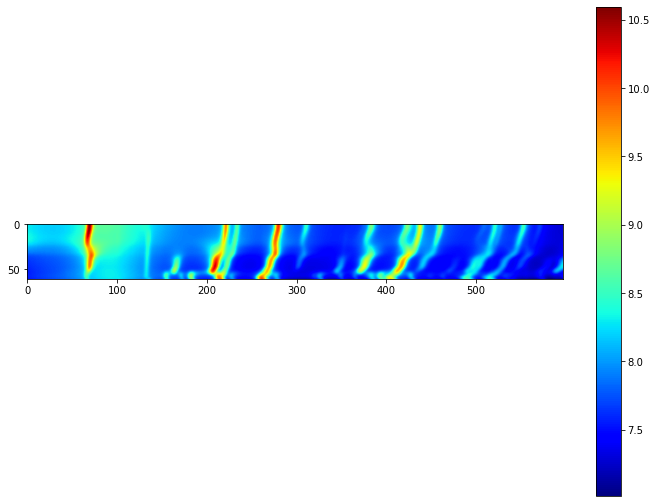

In [12]:
logim(highlow_T[1].T)
#plt.imshow((highlow_T[1].T), cmap = 'jet')
plt.colorbar()

In [80]:
%matplotlib inline
plt.rcParams["figure.figsize"]=(12, 9)
iplot_rows(highlow_T[1], patterns.T, 'low-freq', 'full', log = False, offset = 1)

interactive(children=(IntSlider(value=298, description='i', max=597), Output(layout=Layout(height='550px'))), …

# q filtering

In [975]:
# highlow_q = separate_2d(patterns, ftype = 'step', std = 4, window_high = False)

In [14]:
highlow_q = separate_2d(patterns, ftype = 'step', std = 4, window_high = False, cutoff = .999,
                       pad = 1000)

## high frequency q

Best method: step function x blackman low-pass filter; take amplitude of inverse-transformed signal instead of complex values

In [15]:
from importlib import reload
reload(fourier)

<module 'xrdc.fourier' from '/Users/ollie/anaconda3/lib/python3.7/site-packages/xrdc-1.0-py3.7.egg/xrdc/fourier.py'>

In [16]:
def reference_bgsub():
    bgsubbed_nosmooth = np.vstack([fourier.filter_bg(
    patterns, i, 0, window_type = 'step', deconvolve = False, toreal = 'psd')
                               for i in range(len(patterns))])
    bgsubbed_final = gf(bgsubbed_nosmooth, (1, 1.7))
    bgsubbed_final *= patterns.max() / bgsubbed_final.max() #np.percentile(patterns, 99.9) / np.percentile(bgsubbed_final, 99.9)
    return bgsubbed_final

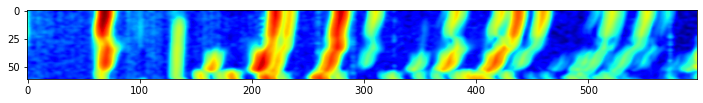

In [17]:
bgsubbed_final = reference_bgsub()
plt.imshow(np.log(1 + np.abs(bgsubbed_final)), cmap = 'jet')

Compare to real component:

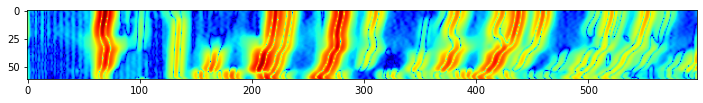

In [18]:
bgsubbed_nosmooth = np.vstack([fourier.filter_bg(
    patterns, i, 0, window_type = 'step', deconvolve = False, toreal = 'real')
                               for i in range(len(patterns))])
bgsubbed_final = gf((bgsubbed_nosmooth), (1, 1.7))
bgsubbed_final *= patterns.max() / bgsubbed_final.max()
plt.imshow(np.log(1 + np.abs(bgsubbed_final)), cmap = 'jet')

The problem with extracting amplitude is that it destroys the additivity of the low- and high-frequency components.

An additional problem with the q decomposition is that the diffraction peaks are so dominant in the signal that they show up in the low-frequency region of the power spectrum:

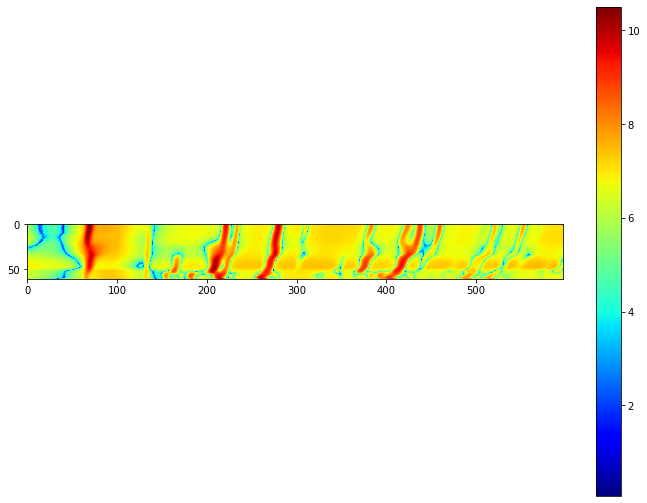

In [1055]:
#plt.imshow(gf(highlow_q[0], (1, 1.7)) , cmap = 'jet')
logim(gf(np.absolute(highlow_q[0]), (0, 0)))
plt.colorbar()

In [19]:
%matplotlib inline
plt.rcParams["figure.figsize"]=(12, 9)
iplot_rows(highlow_q[0], patterns, 'high-freq', 'full', log = False, offset = 0)

interactive(children=(IntSlider(value=30, description='i', max=60), Output(layout=Layout(height='550px'))), _d…

The two parts of this decomposition are consistent, but different from what we want. Compare above and below:

In [20]:
%matplotlib inline
plt.rcParams["figure.figsize"]=(12, 9)
iplot_rows(highlow_q[1], patterns, 'high-freq', 'full', log = False, offset = 0)

interactive(children=(IntSlider(value=30, description='i', max=60), Output(layout=Layout(height='550px'))), _d…

## Fitting the background

This is a different way of getting the low-frequency q component

In [21]:
bgsubbed = reference_bgsub()
bgsubbed[bgsubbed > np.percentile(bgsubbed, 50)] = np.nan

In [22]:
gridx, gridy = np.indices(bgsubbed.shape)
xnew = gridx.ravel()
ynew = gridy.ravel()

In [65]:
from scipy.interpolate import interp1d
def interprows(arr, mask):
    res = []
    for row, rowmask in zip(arr, mask):
        x = np.indices(row.shape)[0][rowmask]
        y = row[rowmask]
        f = interp1d(x, y, bounds_error = False)
        res.append(f(np.indices(row.shape)[0]))
    return np.vstack(res)

In [45]:
bkgmask = ~np.isnan(bgsubbed)

mask_edges = ((np.roll(bkgmask, -1, axis = 0) ^ np.roll(bkgmask, 1, axis = 0)) | (np.roll(bkgmask, -1, axis = 1)\
^ np.roll(bkgmask, 1, axis = 1)))

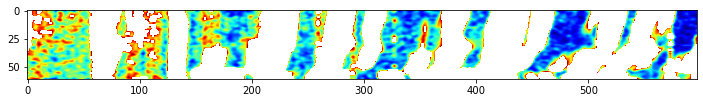

In [50]:
plt.imshow(bgsubbed, cmap = 'jet')

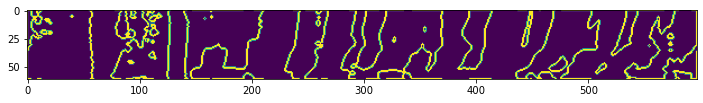

In [46]:
plt.imshow(mask_edges)

In [47]:
filled_bg = interprows(patterns, bkgmask)
smooth_bg = gf(filled_bg, (1, 1.7))

interpolated background:

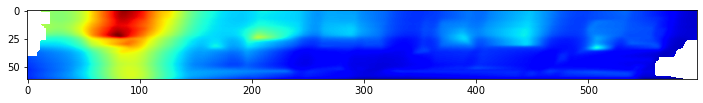

In [48]:
plt.imshow(smooth_bg, cmap = 'jet')

Extracted high-f:

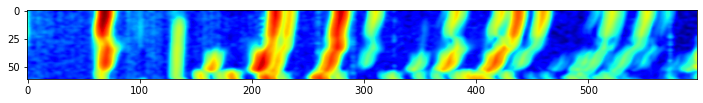

In [66]:
plt.imshow(np.log(1 + reference_bgsub()), cmap = 'jet')

extracted high-f plus interpolated background:

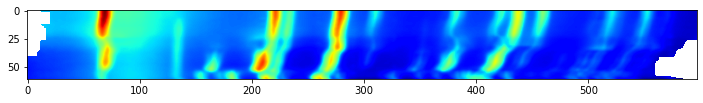

In [52]:
plt.imshow(np.log(1 + smooth_bg + reference_bgsub()), cmap = 'jet')

original data:

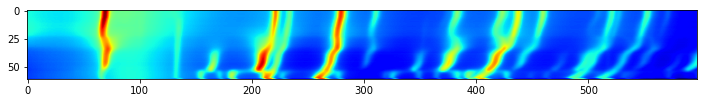

In [64]:
plt.imshow(np.log(1 + patterns), cmap = 'jet')
#plt.colorbar()

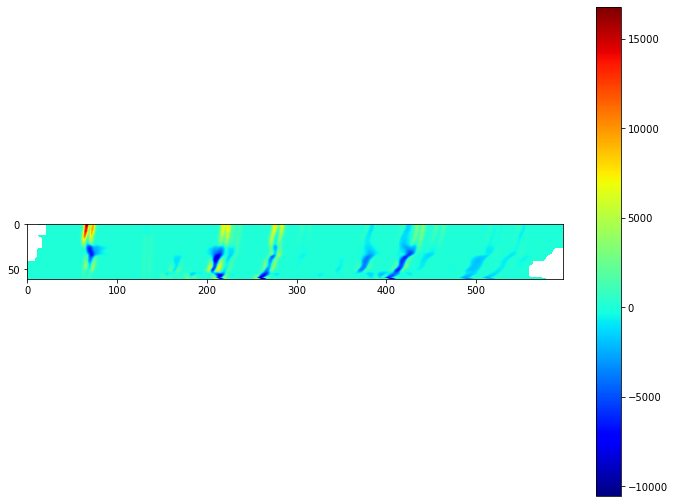

In [61]:
tmp = smooth_bg + reference_bgsub()
plt.imshow(tmp - (patterns * (np.nan_to_num(tmp, 2000).mean() / patterns.mean())), cmap = 'jet')
plt.colorbar()

In [ ]:
%matplotlib inline
iplot_rows(highlow_q[1], patterns, 'high-freq', 'full', log = False, offset = 0)

In [ ]:
# from scipy.interpolate import griddata

# bgedges = ((feat.shuffle(mask_edges.astype(int), 1, 1) * bkgmask))
# x, y = np.where(bgedges)
# z = patterns[x, y]

# znew = griddata((x, y), z, (xnew[None,:], ynew[:,None]), method='linear')

In [852]:
def filtplot(patterns, pad = None, i = 0, ftype = 'step'):
    N = len(patterns[0])
    if pad is None:
        pad = N
    
    g = y = np.pad(patterns[i], pad, mode = 'edge')
    

    window, ywf = spec_fft(patterns, i, pad)

#     H = clip_low_window(ywf, .008, inc_window=True)
#     L = 1 - H
    
    if ftype == 'step':
        L = clip_high_window(ywf, .9)
        H = 1 - L

    elif ftype == 'gaussian':
        gwindow = signal.gaussian(len(y), std = 4)

        L = np.absolute(fftshift(fft(gwindow)))
        L /= np.absolute(L).max()
        H = 1 - L

    else:
        raise Exception

    gfft = fftshift(fft(g))

    a, b = 2, 3

    plt.subplot(a, b, 1)
    plt.plot(g)
    plt.subplot(a, b, 2)
    plt.plot(mag(gfft))
    plt.subplot(a, b, 3)
    plt.plot(power(L), label = 'filter')
    plt.plot(mag(gfft) / mag(gfft).max(), label = 'peak power spectrum')

    plt.legend()

    plt.subplot(a, b, 4)
    plt.plot(mag(ifft(ifftshift(gfft))))

    plt.subplot(a, b, 5)
    plt.plot(g, label = 'original')
    plt.plot(mag(ifft(ifftshift(gfft * L))), label = 'low frequency')
    plt.subplot(a, b, 6)
    
    ifth = ifft(ifftshift(gfft * H))
    
    plt.plot(np.real(ifft(ifftshift(gfft * H))), label = 'high frequency')
    #plt.plot(-mag(ifth), label = '- high frequency')
    #plt.plot(g - mag(ifft(ifftshift(gfft * L))))
    plt.legend()
    plt.grid()
    return g, gfft, H, L, ifth

mark

In [341]:
%matplotlib notebook

In [338]:
fftfreq(np.arange(10).astype(float))

ValueError: n should be an integer

<IPython.core.display.Javascript object>


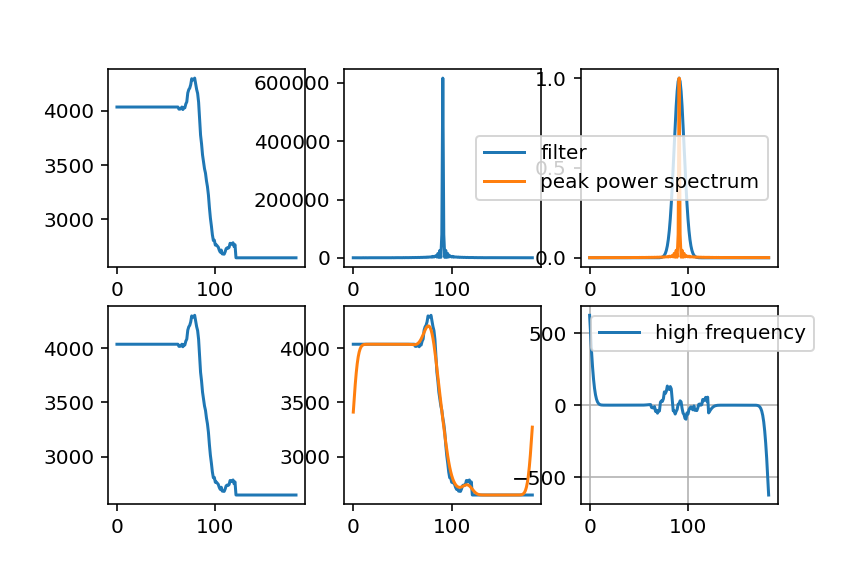

In [853]:
# Low pass function on T
g, gfft, H, L, ifth = filtplot(patterns.T, pad = None, i = 50, ftype = 'gaussian')
#plt.plot(25 * np.angle(ifth))

<IPython.core.display.Javascript object>


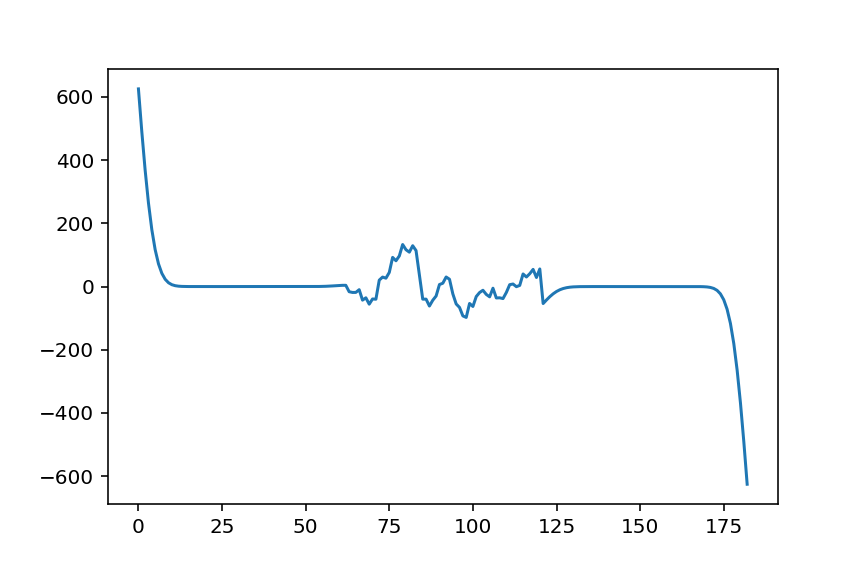

In [854]:
#plt.plot(np.angle(ifth))
plt.plot(np.real(ifth))

<IPython.core.display.Javascript object>


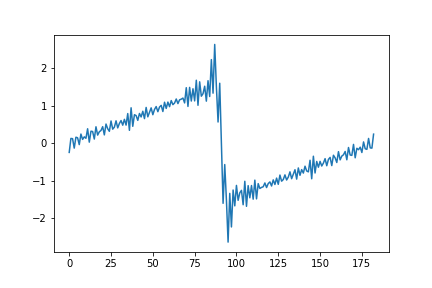

In [800]:
plt.plot(np.angle(gfft))

In [717]:
plt.plot(g)

<IPython.core.display.Javascript object>


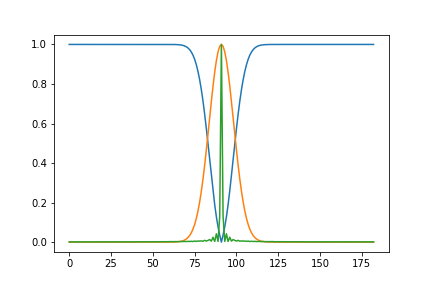

In [634]:
plt.plot(np.absolute(H))
plt.plot(np.absolute(L))
plt.plot(np.absolute(gfft) / np.absolute(gfft).max())

In [ ]:
plt.plot(np.abl)

In [373]:
np.absolute(gfft).max()

array([9.33083500e+02, 5.12627172e+02, 7.21554275e+02, 7.74237594e+02,
       6.21049938e+02, 6.75925082e+02, 8.07442072e+02, 5.69603498e+02,
       7.52846700e+02, 7.22036920e+02, 7.03376293e+02, 6.77635613e+02,
       8.23414182e+02, 6.10030499e+02, 7.30413327e+02, 8.44377307e+02,
       5.59296579e+02, 8.24738741e+02, 7.24600054e+02, 6.79720500e+02,
       7.48404424e+02, 8.11657355e+02, 6.28122387e+02, 8.26838730e+02,
       7.79680594e+02, 6.81450005e+02, 8.25847644e+02, 8.06928756e+02,
       6.63770197e+02, 9.21662444e+02, 7.27628782e+02, 8.06193520e+02,
       8.54827699e+02, 7.73249492e+02, 8.97194816e+02, 7.27665853e+02,
       1.03556031e+03, 6.92988161e+02, 9.83207965e+02, 9.29735871e+02,
       7.55094302e+02, 1.06823899e+03, 8.60303888e+02, 9.18371389e+02,
       1.00945951e+03, 1.01230536e+03, 8.87945088e+02, 1.12229311e+03,
       1.01959522e+03, 9.35639459e+02, 1.25361849e+03, 9.65180168e+02,
       1.18497716e+03, 1.14282838e+03, 1.22601998e+03, 1.07484210e+03,
      

<IPython.core.display.Javascript object>


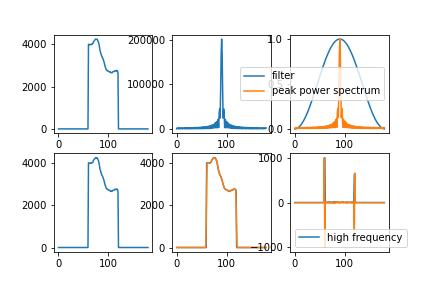

In [360]:
plt.plot(g)

<IPython.core.display.Javascript object>


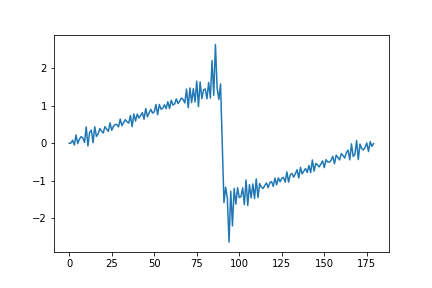

In [352]:
plt.plot(np.angle(gfft))

In [316]:
filtplot(patterns)

/Users/ollie/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Users/ollie/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Users/ollie/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the ear

<IPython.core.display.Javascript object>


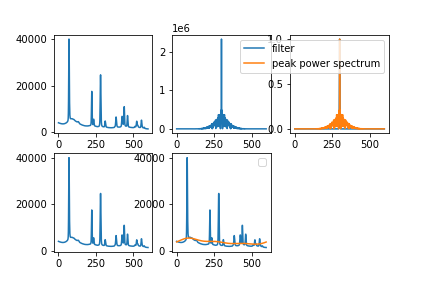

In [330]:
# window function
gwindow = signal.gaussian(len(patterns[0]), std = 40)

L = power(fftshift(fft(gwindow)))
L /= L.max()
H = 1 - L

#H = clip_low_window(ywf, .001) #* window

# peak shape
#g = curve

g = patterns[0]# - bgsubbed_final[0]
#g = y
#g = signal.gaussian(len(y), std = 2) + curve

# #g = l

gfft = fftshift(fft(g))

a, b = 2, 3

plt.subplot(a, b, 1)
plt.plot(g)
plt.subplot(a, b, 2)
plt.plot(mag(gfft))
plt.subplot(a, b, 3)
plt.plot(L, label = 'filter')
plt.plot(mag(gfft) / mag(gfft).max(), label = 'peak power spectrum')

plt.legend()

plt.subplot(a, b, 4)
plt.plot(mag(ifft(ifftshift(gfft))))

plt.subplot(a, b, 5)
plt.plot(g)
plt.plot(mag(ifft(ifftshift(gfft * L))))
plt.legend()

FFT filtering with Blackman high pass:

<IPython.core.display.Javascript object>


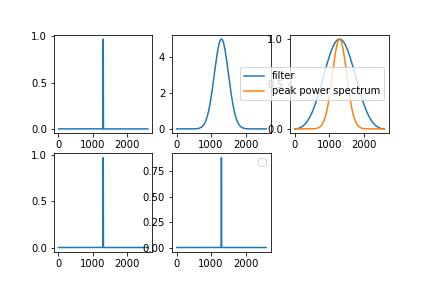

/Users/ollie/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1289: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [331]:
# window function
gwindow = signal.gaussian(len(y), std = 4)

L = power(fftshift(fft(gwindow)))
L /= L.max()
#H = 1 - L

H = clip_low_window(ywf, .001) * window

# peak shape
g = signal.gaussian(len(y), std = 2)
#g = l

gfft = fftshift(fft(g))

a, b = 2, 3

plt.subplot(a, b, 1)
plt.plot(g)
plt.subplot(a, b, 2)
plt.plot(mag(gfft))
plt.subplot(a, b, 3)
plt.plot(H, label = 'filter')
plt.plot(mag(gfft) / mag(gfft).max(), label = 'peak power spectrum')

plt.legend()

plt.subplot(a, b, 4)
plt.plot(mag(ifft(ifftshift(gfft))))

plt.subplot(a, b, 5)
plt.plot(mag(ifft(ifftshift(gfft * H))))
plt.legend()

<IPython.core.display.Javascript object>


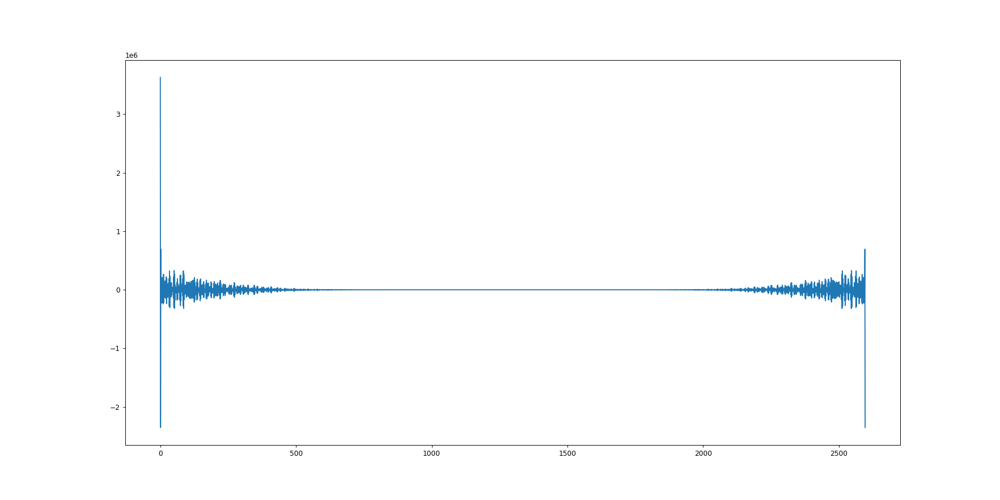

In [276]:
plt.plot(np.real(ywf))

In [150]:
def sinc():
    return np.sinc(2 * fc * (n - (N - 1) / 2.))

In [258]:
from xrdc import xrdutils as xdu

In [268]:
from importlib import reload
reload(xdu)

In [281]:
def shifted_window(shift):
    ws = xdu.mutate_pattern(window, shift, np.arange(len(window)), scale_type='shift', default_grid = False, peak_height= False,
                           noise_scale = 0, noise_type=None)
    return ws

<IPython.core.display.Javascript object>


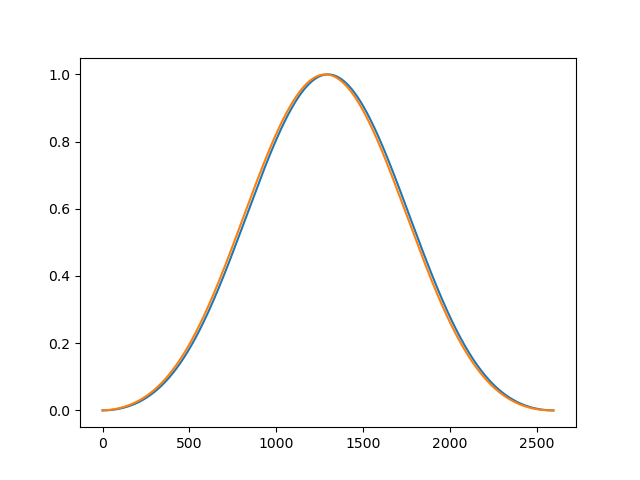

In [282]:
plt.plot(window)
plt.plot(shifted_window(15))

In [168]:
fc = 0.95
n = np.arange(N)


sinc_func = sinc() * window
sinc_func = sinc_func / np.sum(sinc_func)

# # reverse function
# sinc_func = -sinc_func
# sinc_func[int((N - 1) / 2)] += 1

new_signal = np.convolve(y, sinc_func)

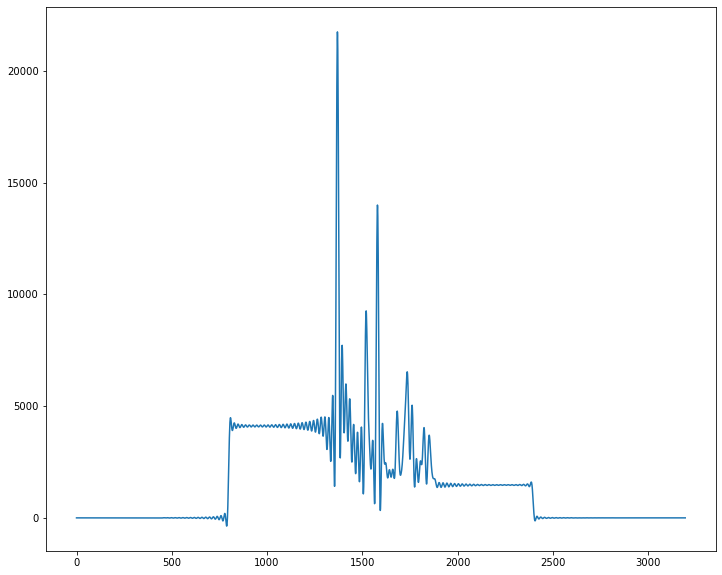

In [169]:
plt.plot(new_signal)

In [80]:
b, a = butter(4, .5, 'low')

In [84]:
w, h = signal.freqs(b, a)


/Users/ollie/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1289: ComplexWarning:

Casting complex values to real discards the imaginary part



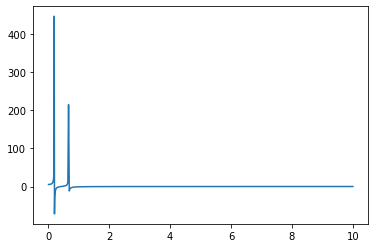

In [87]:
plt.plot(w, h)

In [1020]:
b, a = signal.butter(4, .1, 'high', analog=False)

In [1021]:
signal.filtfilt(b, a, patterns[0])

array([ -1.24676689,  -7.39430013, -19.02473625, ...,  -1.81418009,
        -4.95127594,  -7.30570097])

<IPython.core.display.Javascript object>


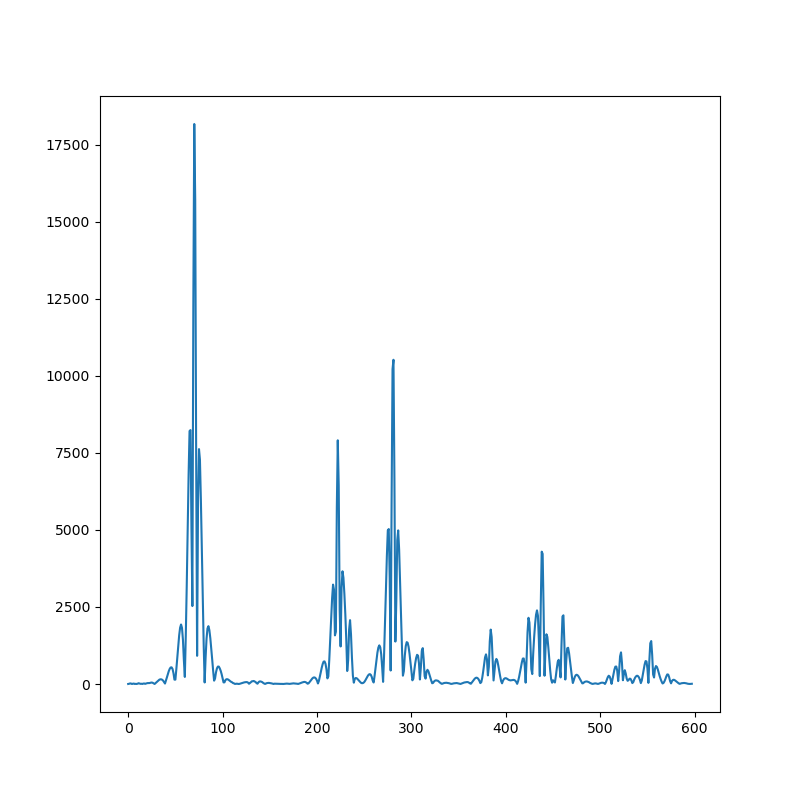

In [1022]:
plt.plot(np.abs(signal.filtfilt(b, a, patterns[0])))

In [92]:
filtered = signal.sosfilt(sos, y)

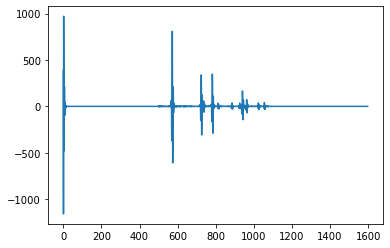

In [93]:
plt.plot(filtered)

In [39]:
import plotly.express as px
pd.options.plotting.backend = "plotly"

In [52]:
pd.DataFrame([y, np.real(yy), rec]).T.plot()

In [ ]:
Wn = float(1)/HalfSampling
b, a = signal.butter(3, Wn, 'high', analog=False)
BxHPF = signal.filtfilt(b, a, Bxfft)
ByHPF = signal.filtfilt(b, a, Byfft)
plt.plot(BxTime, BxHPF, label='Canal 1', color='r', linewidth=0.5, linestyle="-")
plt.plot(ByTime, ByHPF, label='Canal 3', color='b', linewidth=0.5, linestyle="-")